In [1]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.morphology import (ball)
from quantimpy import morphology as mp
from quantimpy import minkowski as mk
from dataclasses import dataclass, field
from ripser import Rips
from persim import plot_diagrams

import cv2 as cv
import os
import argparse
import math
import time
import zlib
import base64
import io 
import datetime

from tkinter import *
from tkinter import Label, Tk, Button,ttk
from PIL import ImageTk,Image

from joblib import Parallel, delayed
import pandas as pd
import random
import warnings
import random

class RockData(object):
    def __init__(self, id, path, path_mask,list2,img_num,level_num,level_map):
        self.id = id
        self.path = path
        self.path_mask = path_mask
        self.list2 = list2
        self.img_num = img_num
        self.level_num = level_num
        self.level_map = level_map

    def level_update(self,level_num,level_map):
        self.level_num = level_num
        self.level_map = level_map 

class RockGraf(object):
    def __init__(self, id, volume, surface, curvature, euler, dist):
        self.id = id
        self.volume = volume
        self.surface = surface
        self.curvature = curvature
        self.euler = euler
        self.dist = dist

In [2]:
def gen_3d_img(myRock, dop_name):
    img = cv.imread(os.path.join(myRock.path, myRock.list2[img_num//2]), cv.IMREAD_GRAYSCALE)

    x_range = img.shape[0]
    y_range = img.shape[1]

    # размер воксельного тела
    print("Размер воксельного тела: ", x_range, "x", y_range, "x", len(myRock.list2))

    # создание массива

    voks_poch = np.zeros([img.shape[0],img.shape[1],len(myRock.list2)],dtype=int)

    # заполение массива данными о теле

    values = len(myRock.list2)
    percent = values / 100
    j = 0
    z = 0
    level_map = np.zeros(255,dtype=int)

    for i in range(len(myRock.list2)):
        img = cv.imread(os.path.join(path, myRock.list2[i]), cv.IMREAD_GRAYSCALE)
        if img.shape[0] == x_range and img.shape[1] == y_range:
            for x in range(x_range):
                for y in range(y_range):
                    voks_poch[x,y,z]=img[x,y]
                    z += 1
                    level_map[img[x,y]] += 1
        else:
            print('ERROR: Rock ' + str(myRock.id) + ': Bad image for x/y range in file ' + myRock.path + myRock.list[i])
        
        if i > j * percent:
            print(j,'/100 i=',i)
            j = j + 1

    myRock.level_num = 0
    myRock.level_map = np.zeros(np.count_nonzero(level_map),dtype=int)

    for i in range(255):
        if level_map != 0:
            myRock.level_map[myRock.level_num] = level_map[i]
            myRock.level_num += 1

    f = open('voksel_poch_' + str(myRock.id) + dop_name + '.conf', 'w+')

    f.write(str(x_range))
    f.write("\n")
    f.write(str(y_range))
    f.write("\n")
    f.write(str(len(myRock.list2)))
    f.write("\n")
    f.write(str(myRock.level_num))
    f.write("\n")
    for i in range(len(myRock.level_map)):
        f.write(str(myRock.level_map[i]) + ' ')

    f.close()

    print('Finish write voksel_poch_' + str(myRock.id) + '.conf.')

    f = open('voksel_poch_' + str(myRock.id) + '.bin', 'wb+')

    values = x_range*y_range*len(myRock.list2)
    percent = x_range/100
    j = 0

    for x in range(x_range):
        for y in range(y_range):
            for i in range(len(myRock.list2)):
                byte_string = bytes([voks_poch[x,y,i]])
                f.write(byte_string)
                
                if x >= j * percent:
                    print(j,'/100 i=',x)
                    j = j + 1
        
    f.close()

    print('Finish write voksel_poch_' + str(myRock.id) + '.bin.')

def save_3d_img(img3d, name):

    x_range = img3d.shape[0]
    y_range = img3d.shape[1]
    z_range = img3d.shape[2]

    # размер воксельного тела
    print("Размер воксельного тела: ", x_range, "x", y_range, "x", z_range)

    f = open(name + '.conf', 'w+')

    f.write(str(x_range))
    f.write("\n")
    f.write(str(y_range))
    f.write("\n")
    f.write(str(z_range))
    f.write("\n")
    f.write(str(0))
    f.write("\n")
    # for i in range(len(myRock.level_map)):
    #     f.write(str(myRock.level_map[i]) + ' ')

    f.close()

    print('Finish write ' + name + '.conf.')

    f = open(name + '.bin', 'wb+')

    values = x_range*y_range*z_range
    percent = x_range/100
    j = 0

    for x in range(x_range):
        for y in range(y_range):
            for i in range(z_range):
                byte_string = bytes([img3d[x,y,i]])
                f.write(byte_string)
                
                if x >= j * percent:
                    print(j,'/100 i=',x)
                    j = j + 1
        
    f.close()

    print('Finish write' + name + '.bin.')

def open_3d_img(name, type):
    if type == 'i':
        name = 'voksel_poch_' + name
    else : 
        if type == 'f':
            name = name
        else :
            print("ERROR: Not correct type name's type.")
            return 0
    
    f = open(name + '.conf', 'r')
    x_range = int(f.readline())
    y_range = int(f.readline())
    z_range = int(f.readline())

    f.close()

    #print(x_range, y_range, z_range)

    voks_poch = np.zeros([x_range, y_range, z_range],dtype=int)
    j = 0
    percent = int(x_range / 100)

    with open(name + '.bin', 'rb') as f:
        byte = f.read(1)
        for x in range(x_range):
            for y in range(y_range):
                for z in range(z_range):
                    voks_poch[x,y,z] = int.from_bytes(byte, "big")
                    byte = f.read(1)
            
            if x > percent * j:
                #print(x, '/ ', x_range)
                j = j + 1
            # plt.gray()
            # plt.imshow(voks_poch[x,:,:])
            # plt.show()
            
    f.close()

    return voks_poch

id =  2
Image count =  1851


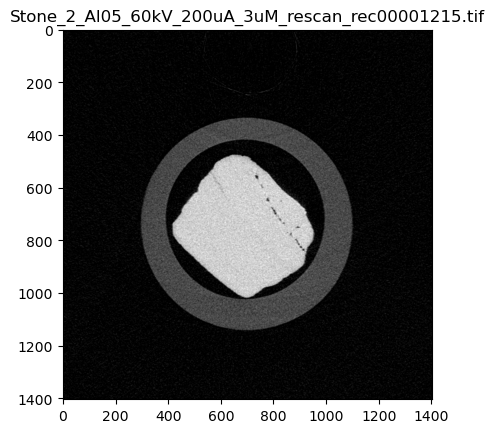

id =  9
Image count =  2432


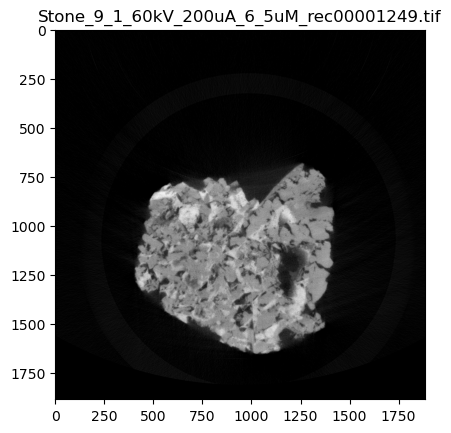

id =  10
Image count =  2223


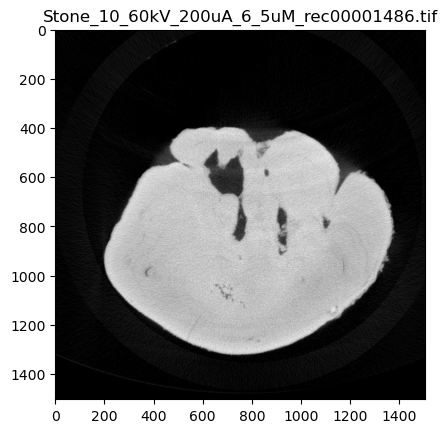

id =  11
Image count =  1769


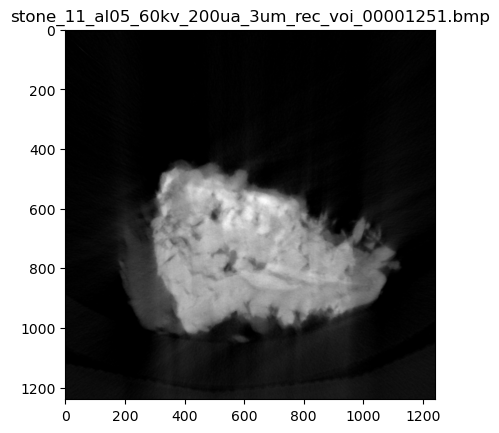

id =  12
Image count =  1803


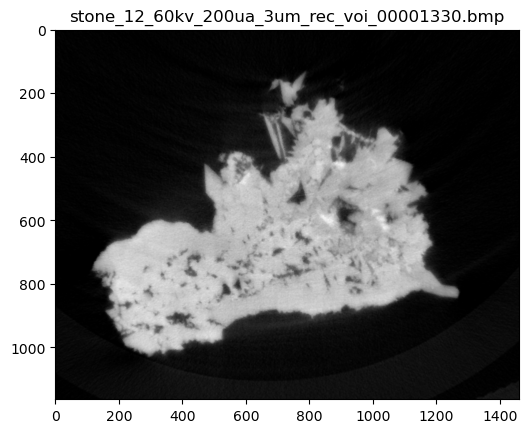

id =  13
Image count =  2350


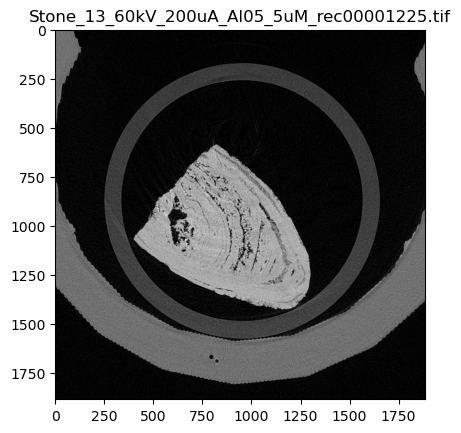

id =  16
Image count =  1896


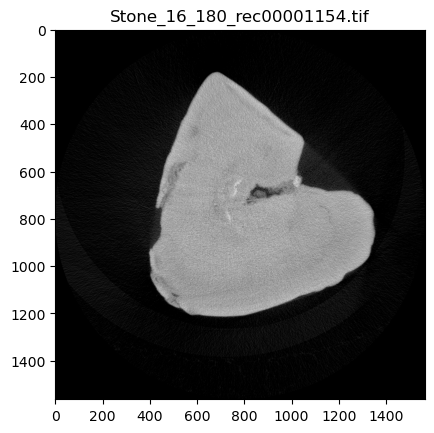

id =  18
Image count =  2385


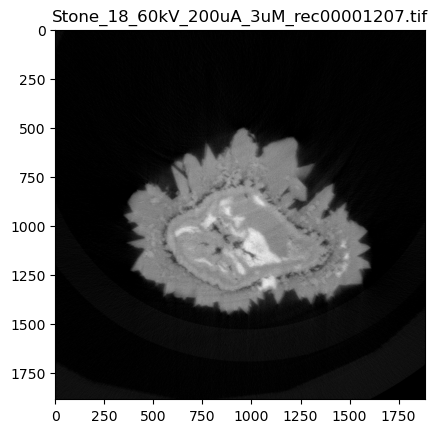

id =  19
Image count =  1900


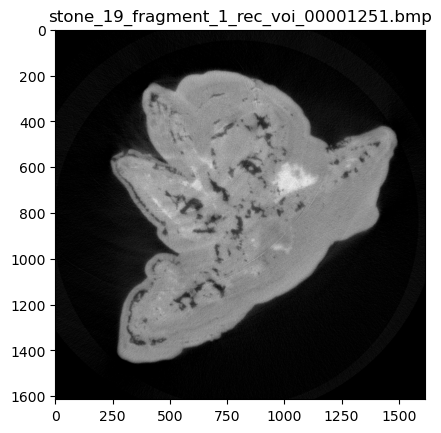

id =  20
Image count =  1911


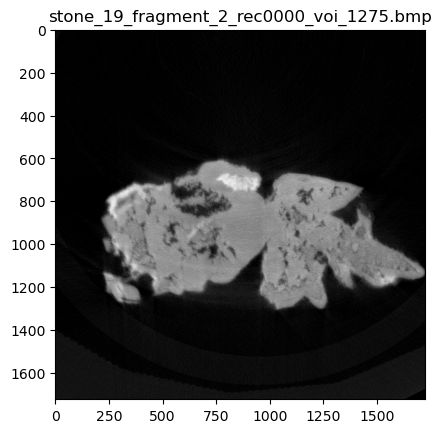

id =  25
Image count =  1626


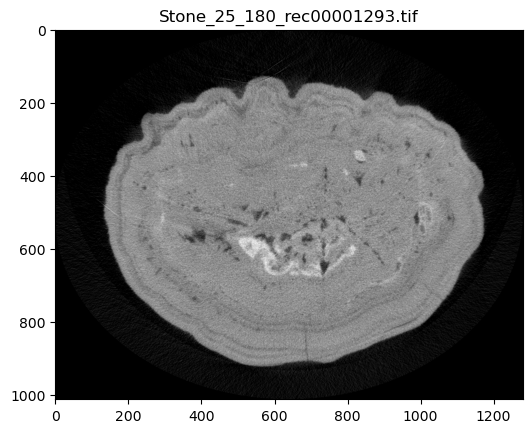

id =  27
Image count =  2271


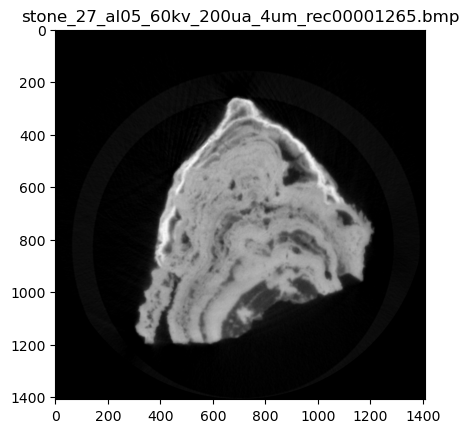

id =  28
Image count =  2213


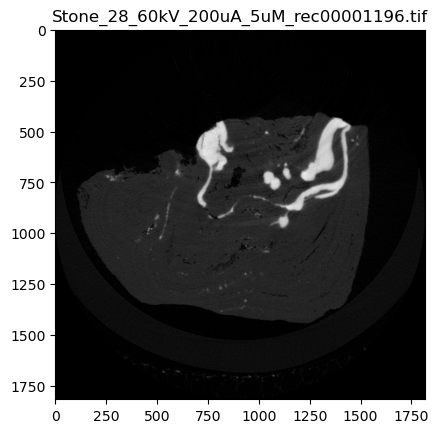

id =  30
Image count =  1945


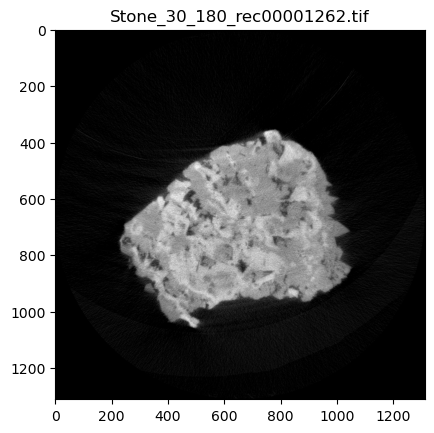

id =  31
Image count =  1608


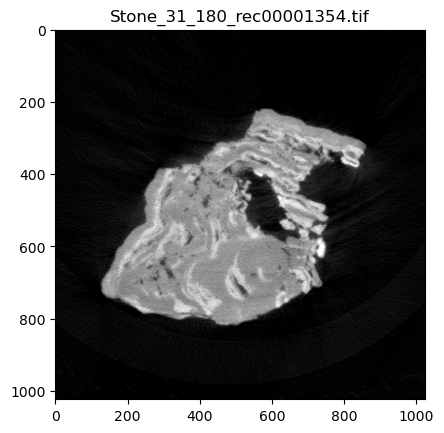

id =  32
Image count =  2608


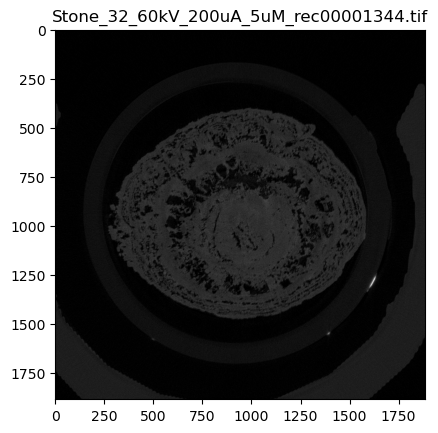

id =  33
Image count =  1912


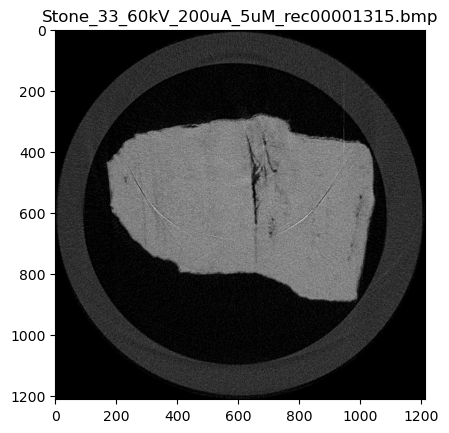

id =  34
Image count =  1562


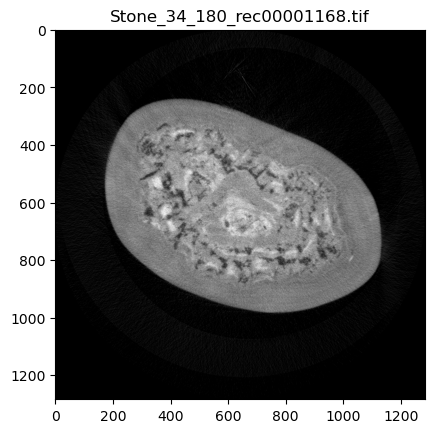

id =  35
Image count =  2368


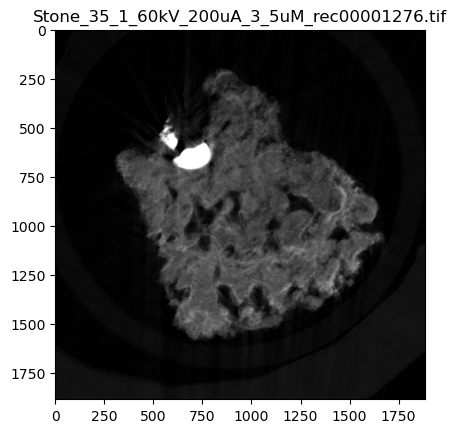

id =  36
Image count =  1277


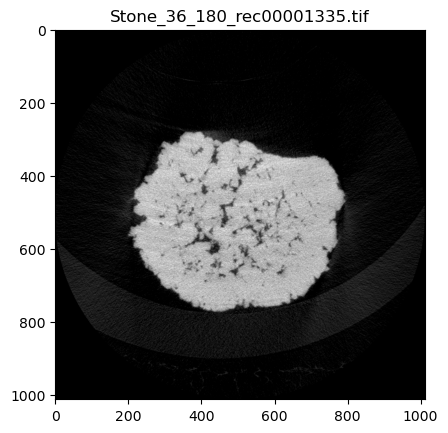

id =  37
Image count =  1846


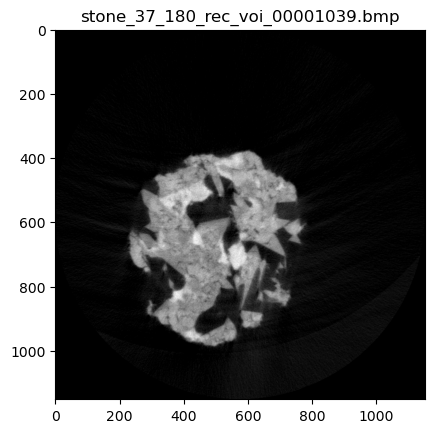

id =  40
Image count =  2234


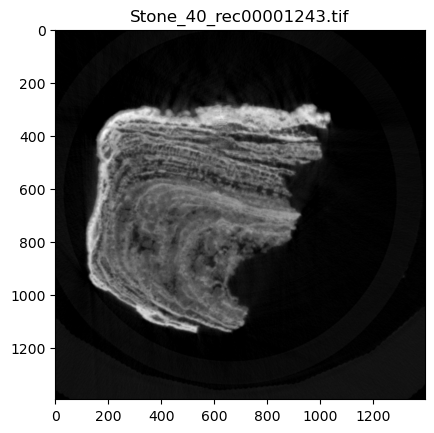

id =  43
Image count =  1145


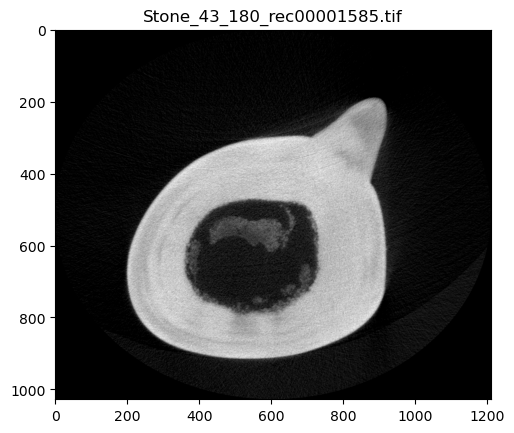

id =  50
Image count =  1435


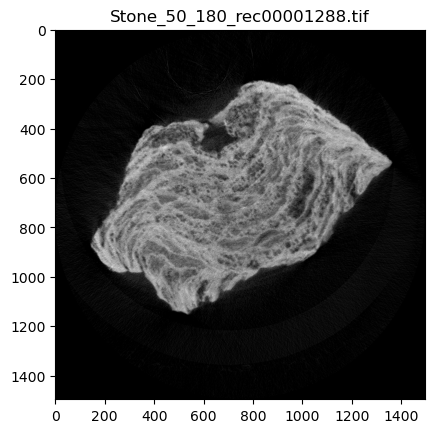

id =  51
Image count =  904


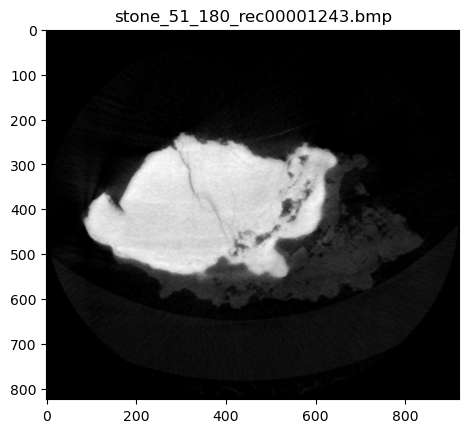

id =  52
Image count =  1265


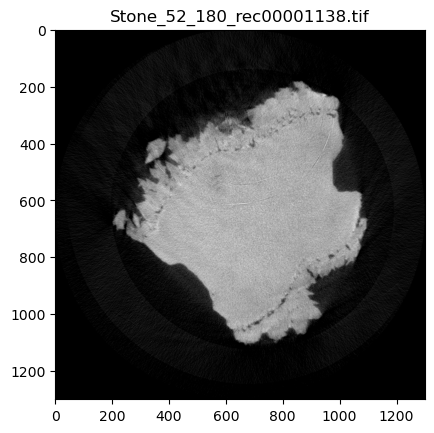

id =  82
Image count =  1727


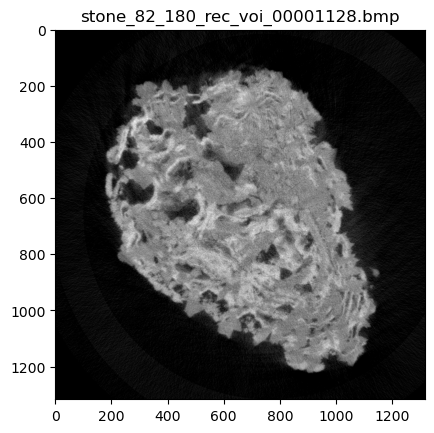

id =  153
Image count =  1017


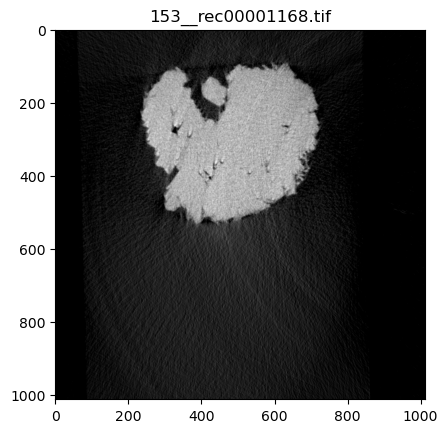

id =  155
Image count =  1695


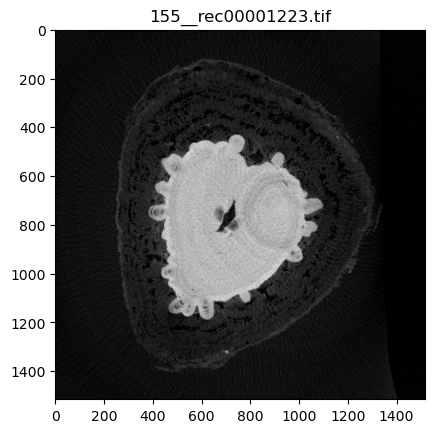

id =  1001
Image count =  2244


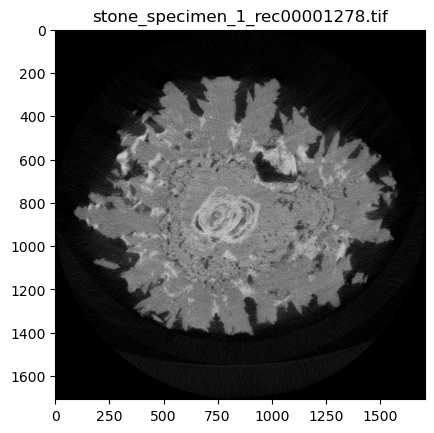

id =  1002
Image count =  2016


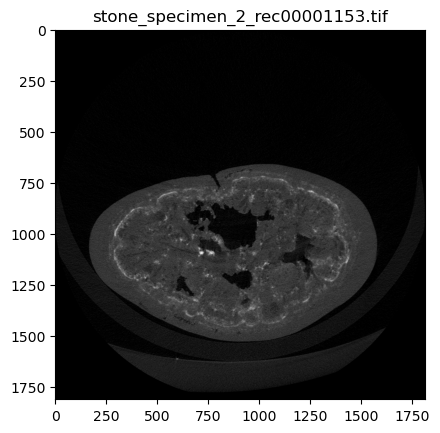

id =  10002
Image count =  1851


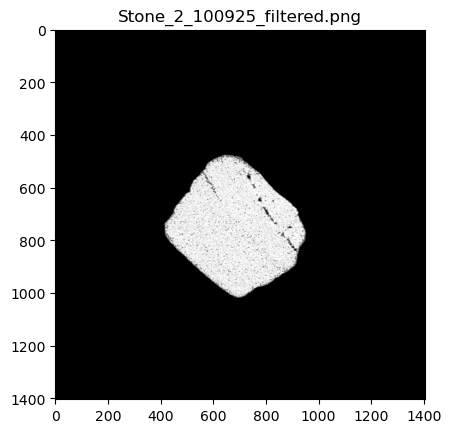

id =  10009
Image count =  2432


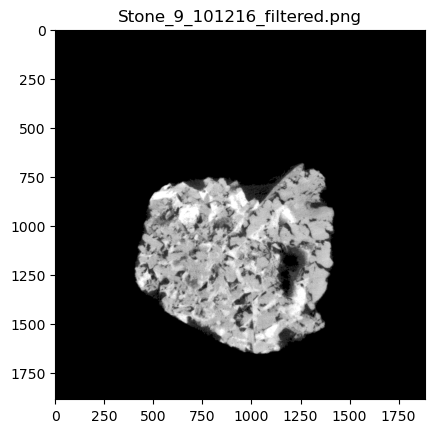

id =  10010
Image count =  2223


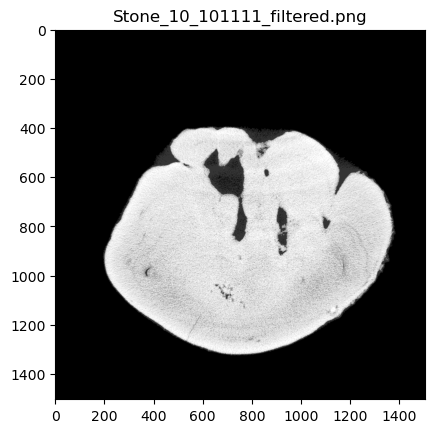

id =  10011
Image count =  1769


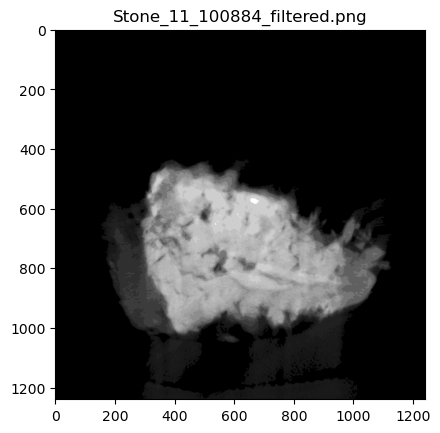

id =  10012
Image count =  1803


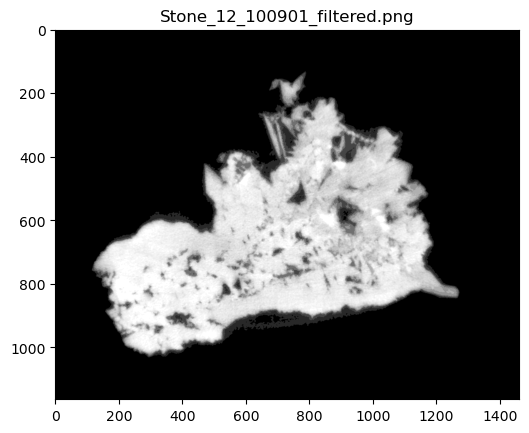

id =  10013
Image count =  2350


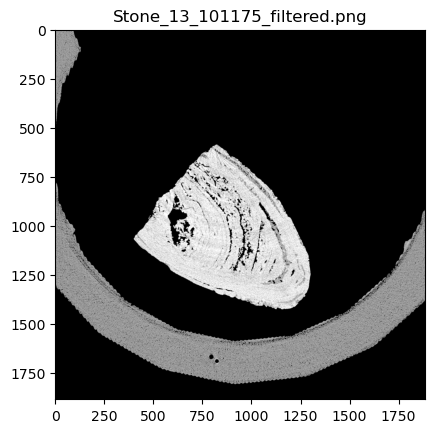

id =  10016
Image count =  1896


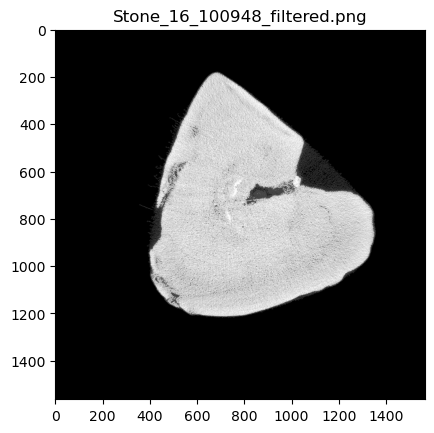

id =  10018
Image count =  2385


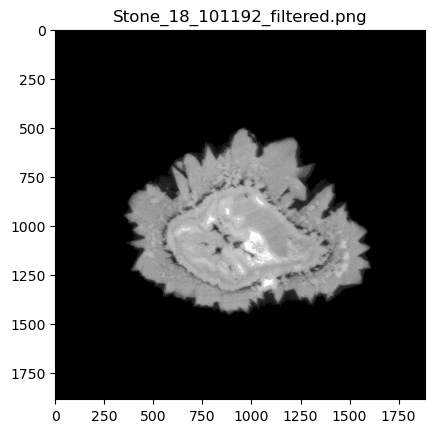

id =  10019
Image count =  1900


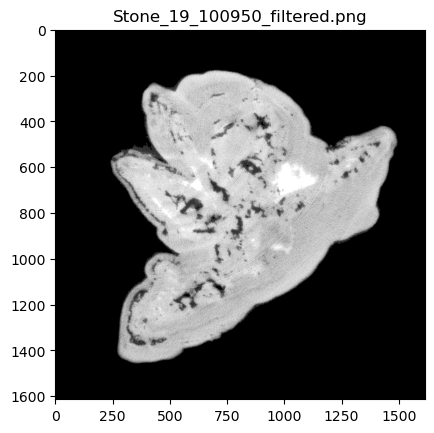

id =  10020
Image count =  1911


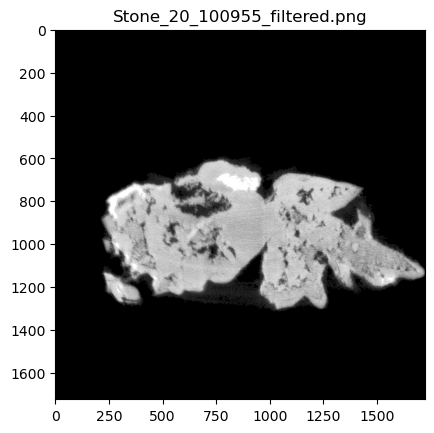

id =  10025
Image count =  1626


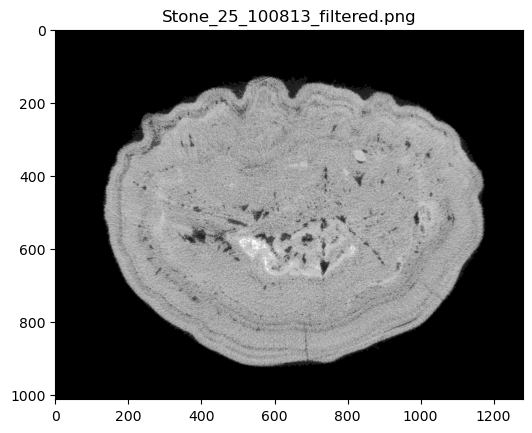

id =  10027
Image count =  2271


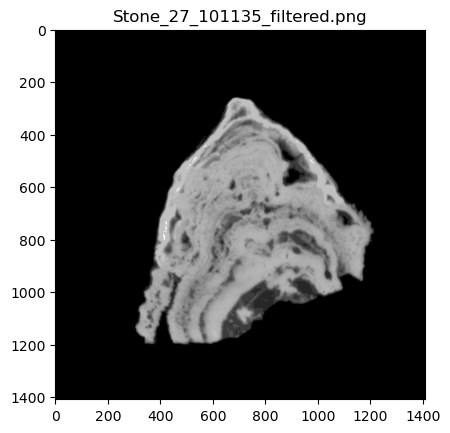

id =  10028
Image count =  2213


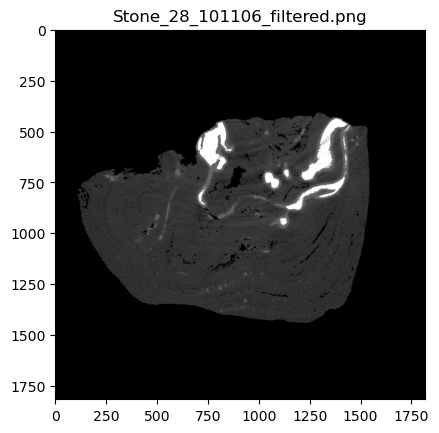

id =  10030
Image count =  1945


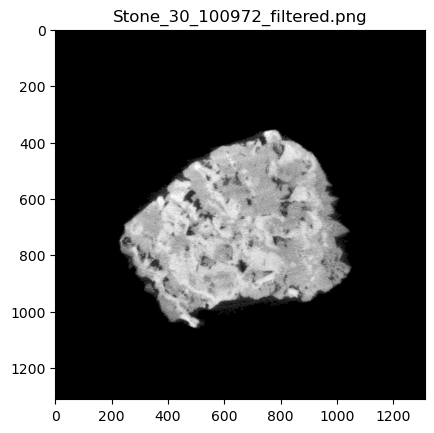

id =  10031
Image count =  1608


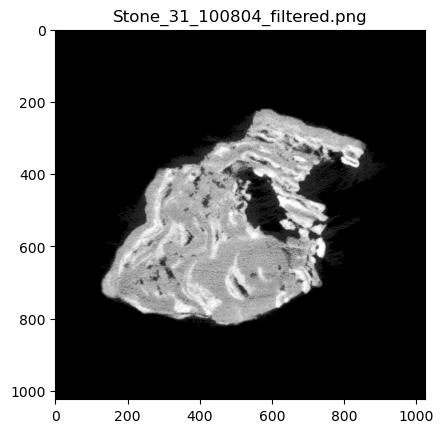

id =  10032
Image count =  2608


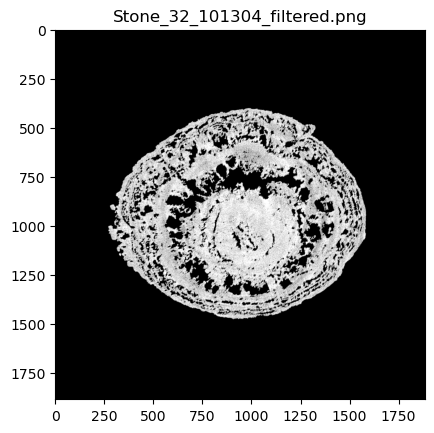

id =  10033
Image count =  1912


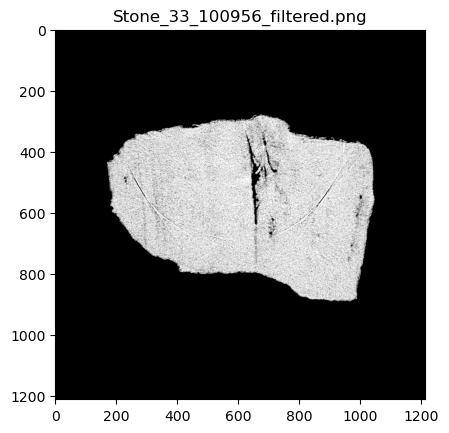

id =  10034
Image count =  1562


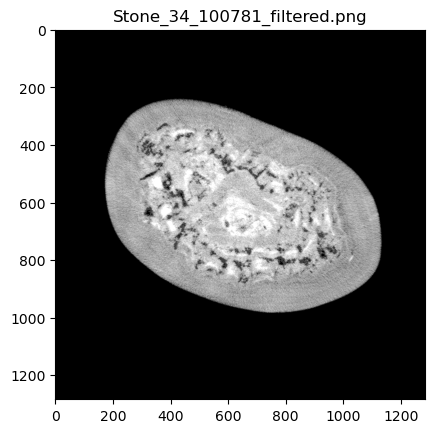

id =  10035
Image count =  2368


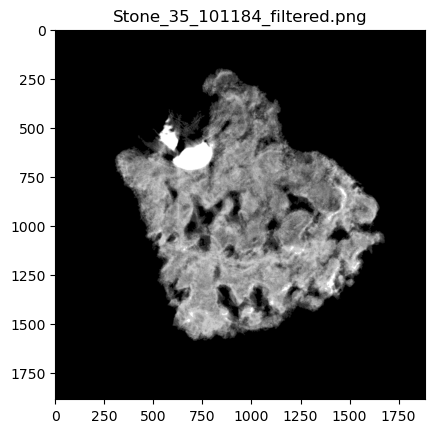

id =  10036
Image count =  1277


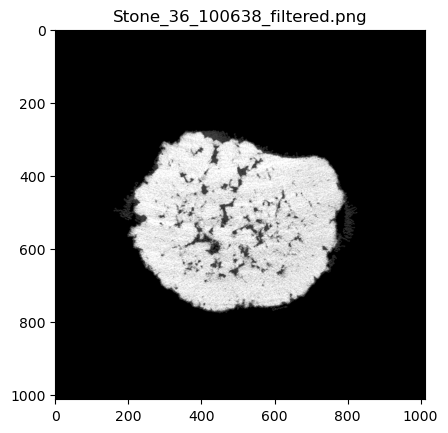

id =  10037
Image count =  1846


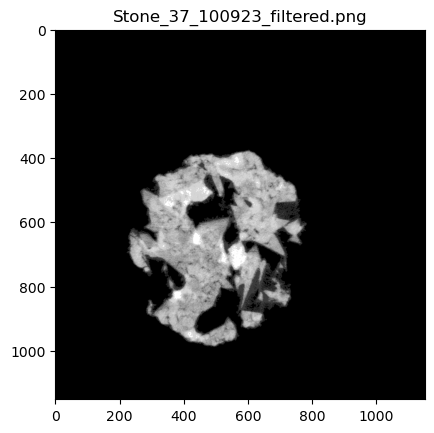

id =  10040
Image count =  2234


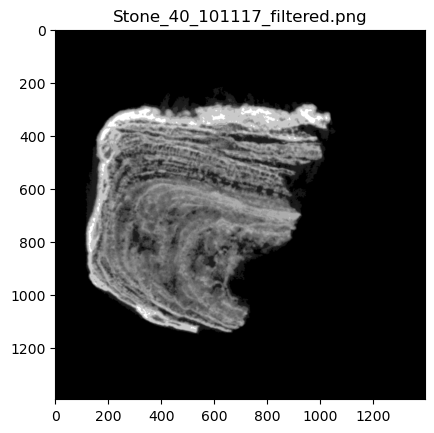

id =  10043
Image count =  1145


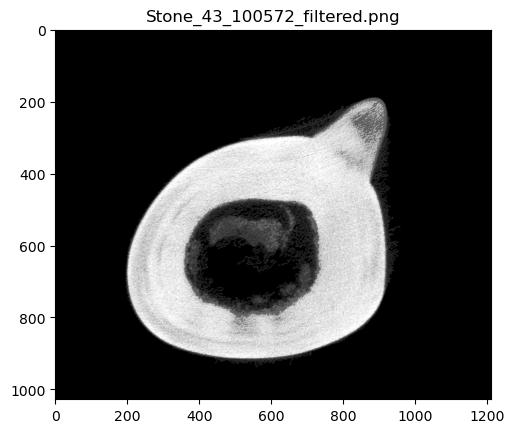

id =  10050
Image count =  1435


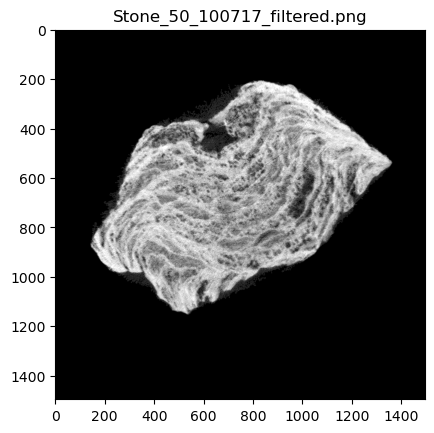

id =  10051
Image count =  904


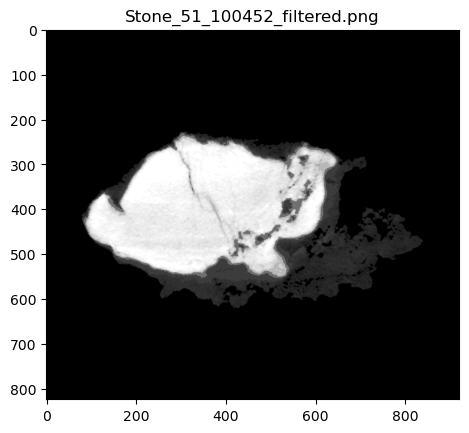

id =  10052
Image count =  1265


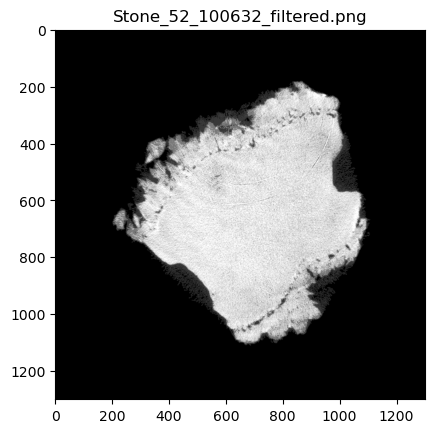

id =  10082
Image count =  1727


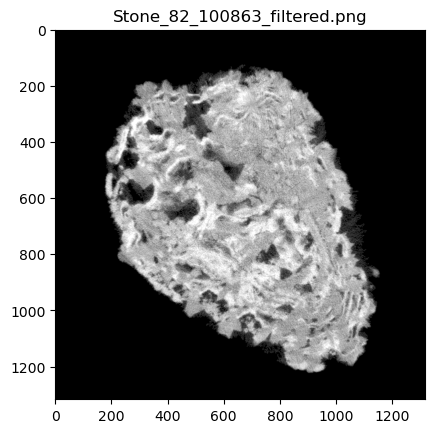

id =  10153
Image count =  1017


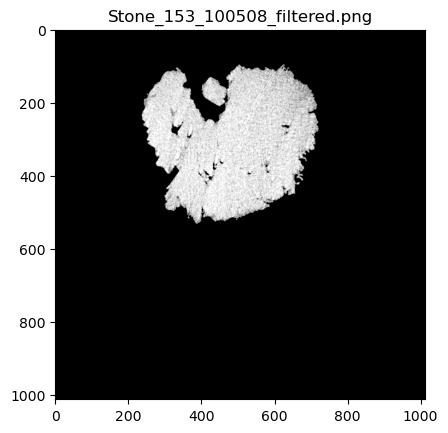

id =  10155
Image count =  1695


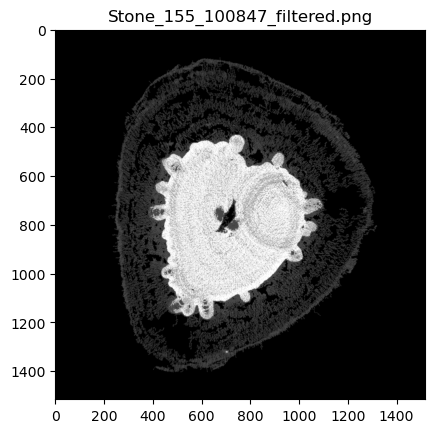

id =  11001
Image count =  2244


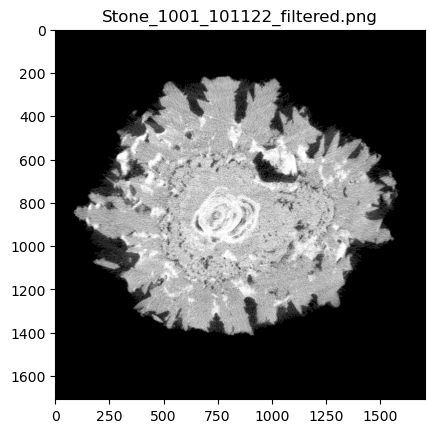

id =  11002
Image count =  2016


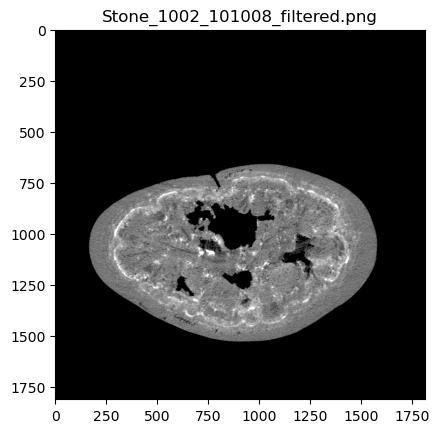

In [3]:
 #Выбор камней

id_rock = [2, 9, 10, 11, 12, 13, 16, 18, 19, 20, 25, 27, 28, 30, 31, 32, 33, 34, 35, 36, 37, 40, 43, 50, 51, 52, 82, 153, 155, 1001, 1002, 10002, 10009, 10010, 10011, 10012, 10013, 10016, 10018, 10019, 10020, 10025, 10027, 10028, 10030, 10031, 10032, 10033, 10034, 10035, 10036, 10037, 10040, 10043, 10050, 10051, 10052, 10082, 10153, 10155, 11001, 11002]
          #0  1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26   27   28    29    30
#2, 9, 10, 11, 12, 13. 16, 18, 19, 20, 25, 27, 28, 30, 31, 32, 33, 34, 35, 36, 37, 40, 43, 50, 51, 52, 82, 153, 155, 1001, 1002
#2, 9, 10, 11, 12, 13, 16, 18, 19, 20, 25, 27, 28, 30, 31, 32, 33, 34, 35, 36, 37, 40, 43, 50, 51, 52, 82, 153, 155, 1001, 1002
#id = 2     /home/pc-burevestnik/PochRock_v2/Rock_Base_1/Uric acid/Pure uric acid/Stone 2/
#id = 9     /home/pc-burevestnik/PochRock_v2/Rock_Base_1/Calcium/Stone 9/
#id = 10    /home/pc-burevestnik/PochRock_v2/Rock_Base_1/Calcium/Stone 10/
#id = 11    /home/pc-burevestnik/PochRock_v2/Rock_Base_1/Unclass/Stone 11/
#id = 12    /home/pc-burevestnik/PochRock_v2/Rock_Base_1/Unclass/Stone 12/
#id = 13    /home/pc-burevestnik/PochRock_v2/Rock_Base_1/Uric acid/Pure uric acid/Stone 13/
#id = 16    /home/pc-burevestnik/PochRock_v2/Rock_Base_1/Calcium/Stone 16/
#id = 18    /home/pc-burevestnik/PochRock_v2/Rock_Base_1/Calcium/Stone 18/
#id = 19    /home/pc-burevestnik/PochRock_v2/Rock_Base_1/Unclass/Stone 19_1/
#id = 20    /home/pc-burevestnik/PochRock_v2/Rock_Base_1/Unclass/Stone 19_2/
#id = 25    /home/pc-burevestnik/PochRock_v2/Rock_Base_1/Calcium/Stone 25/
#id = 27    /home/pc-burevestnik/PochRock_v2/Rock_Base_1/Unclass/Stone 27/
#id = 28    /home/pc-burevestnik/PochRock_v2/Rock_Base_1/Uric acid/Uric acid with calcium/Stone 28/
#id = 30    /home/pc-burevestnik/PochRock_v2/Rock_Base_1/Calcium/Stone 30/
#id = 31    /home/pc-burevestnik/PochRock_v2/Rock_Base_1/Calcium/Stone 31/
#id = 32    /home/pc-burevestnik/PochRock_v2/Rock_Base_1/Uric acid/Uric acid with calcium/Stone 32/
#id = 33    /home/pc-burevestnik/PochRock_v2/Rock_Base_1/Uric acid/Pure uric acid/Stone 33/
#id = 34    /home/pc-burevestnik/PochRock_v2/Rock_Base_1/Calcium/Stone 34/
#id = 35    /home/pc-burevestnik/PochRock_v2/Rock_Base_1/Unclass/Stone 35/
#id = 36    /home/pc-burevestnik/PochRock_v2/Rock_Base_1/Cystine/Stone 36/
#id = 37    /home/pc-burevestnik/PochRock_v2/Rock_Base_1/Unclass/Stone 37/
#id = 40    /home/pc-burevestnik/PochRock_v2/Rock_Base_1/Unclass/Stone 40/
#id = 43    /home/pc-burevestnik/PochRock_v2/Rock_Base_1/Calcium/Stone 43/
#id = 50    /home/pc-burevestnik/PochRock_v2/Rock_Base_1/Calcium/Stone 50/
#id = 51    /home/pc-burevestnik/PochRock_v2/Rock_Base_1/Unclass/Stone 51/
#id = 52    /home/pc-burevestnik/PochRock_v2/Rock_Base_1/Calcium/Stone 52/
#id = 82    /home/pc-burevestnik/PochRock_v2/Rock_Base_1/Unclass/Stone 82/
#id = 153   /home/pc-burevestnik/PochRock_v2/Rock_Base_1/Cystine/Stone 153/
#id = 155   /home/pc-burevestnik/PochRock_v2/Rock_Base_1/Uric acid/Uric acid with calcium/Stone 155/
#id = 1001  /home/pc-burevestnik/PochRock_v2/Rock_Base_1/Calcium/N1/
#id = 1002  /home/pc-burevestnik/PochRock_v2/Rock_Base_1/Uric acid/Uric acid with calcium/Stone N2/

#10002, 10009, 10010, 10011, 10012, 10013, 10016, 10018, 10019, 10020, 10025, 10027, 10028, 10030, 10031, 10032, 10033, 10034, 10035, 10036, 10037, 10040, 10043, 10050, 10051, 10052, 10082, 10153, 10155, 11001, 11002
#id = 10002     /home/pc-burevestnik/PochRock_v2/Rock_Base_2/Uric acid/Pure uric acid/Stone 2/
#id = 10009     /home/pc-burevestnik/PochRock_v2/Rock_Base_2/Calcium/Stone 9/
#id = 10010     /home/pc-burevestnik/PochRock_v2/Rock_Base_2/Calcium/Stone 10/
#id = 10011     /home/pc-burevestnik/PochRock_v2/Rock_Base_2/Unclass/Stone 11/
#id = 10012     /home/pc-burevestnik/PochRock_v2/Rock_Base_2/Unclass/Stone 12/
#id = 10013     /home/pc-burevestnik/PochRock_v2/Rock_Base_2/Uric acid/Pure uric acid/Stone 13/
#id = 10016     /home/pc-burevestnik/PochRock_v2/Rock_Base_2/Calcium/Stone 16/
#id = 10018     /home/pc-burevestnik/PochRock_v2/Rock_Base_2/Calcium/Stone 18/
#id = 10019     /home/pc-burevestnik/PochRock_v2/Rock_Base_2/Unclass/Stone 19_1/
#id = 10020     /home/pc-burevestnik/PochRock_v2/Rock_Base_2/Unclass/Stone 19_2/
#id = 10025     /home/pc-burevestnik/PochRock_v2/Rock_Base_2/Calcium/Stone 25/
#id = 10027     /home/pc-burevestnik/PochRock_v2/Rock_Base_2/Unclass/Stone 27/
#id = 10028     /home/pc-burevestnik/PochRock_v2/Rock_Base_2/Uric acid/Uric acid with calcium/Stone 28/
#id = 10030     /home/pc-burevestnik/PochRock_v2/Rock_Base_2/Calcium/Stone 30/
#id = 10031     /home/pc-burevestnik/PochRock_v2/Rock_Base_2/Calcium/Stone 31/
#id = 10032     /home/pc-burevestnik/PochRock_v2/Rock_Base_2/Uric acid/Uric acid with calcium/Stone 32/
#id = 10033     /home/pc-burevestnik/PochRock_v2/Rock_Base_2/Uric acid/Pure uric acid/Stone 33/
#id = 10034     /home/pc-burevestnik/PochRock_v2/Rock_Base_2/Calcium/Stone 34/
#id = 10035     /home/pc-burevestnik/PochRock_v2/Rock_Base_2/Unclass/Stone 35/
#id = 10036     /home/pc-burevestnik/PochRock_v2/Rock_Base_2/Cystine/Stone 36/
#id = 10037     /home/pc-burevestnik/PochRock_v2/Rock_Base_2/Unclass/Stone 37/
#id = 10040     /home/pc-burevestnik/PochRock_v2/Rock_Base_2/Unclass/Stone 40/
#id = 10043     /home/pc-burevestnik/PochRock_v2/Rock_Base_2/Calcium/Stone 43/
#id = 10050     /home/pc-burevestnik/PochRock_v2/Rock_Base_2/Calcium/Stone 50/
#id = 10051     /home/pc-burevestnik/PochRock_v2/Rock_Base_2/Unclass/Stone 51/
#id = 10052     /home/pc-burevestnik/PochRock_v2/Rock_Base_2/Calcium/Stone 52/
#id = 10082     /home/pc-burevestnik/PochRock_v2/Rock_Base_2/Unclass/Stone 82/
#id = 10153     /home/pc-burevestnik/PochRock_v2/Rock_Base_2/Cystine/Stone 153/
#id = 10155     /home/pc-burevestnik/PochRock_v2/Rock_Base_2/Uric acid/Uric acid with calcium/Stone 155,
#id = 11001     /home/pc-burevestnik/PochRock_v2/Rock_Base_2/Calcium/N1/
#id = 11002     /home/pc-burevestnik/PochRock_v2/Rock_Base_2/Uric acid/Uric acid with calcium/Stone N2/

#Созданние массива информации о камнях

#Data_about_rocks_p = RockData(0, '0', '0', [0], 0, 0, [0]) 

#Data_about_rocks = RockList(np.zeros(len(id_rock),dtype=RockData))

my_Rocks = []

for i in range(len(id_rock)):
    #Составление списков изображений

    if id_rock[i] == 2:
        file_name = 'Rock_Base_1/Uric acid/Pure uric acid/Stone 2/'
    if id_rock[i] == 9:
        file_name = 'Rock_Base_1/Calcium/Stone 9/'
    if id_rock[i] == 10:
        file_name = 'Rock_Base_1/Calcium/Stone 10/'
    if id_rock[i] == 11:
        file_name = 'Rock_Base_1/Unclass/Stone 11/'
    if id_rock[i] == 12:
        file_name = 'Rock_Base_1/Unclass/Stone 12/'
    if id_rock[i] == 13:
        file_name = 'Rock_Base_1/Uric acid/Pure uric acid/Stone 13/' 
    if id_rock[i] == 16:
        file_name = 'Rock_Base_1/Calcium/Stone 16/'
    if id_rock[i] == 18:
        file_name = 'Rock_Base_1/Calcium/Stone 18/'
    if id_rock[i] == 19:
        file_name = 'Rock_Base_1/Unclass/Stone 19_1/'
    if id_rock[i] == 20:
        file_name = 'Rock_Base_1/Unclass/Stone 19_2/'
    if id_rock[i] == 25:
        file_name = 'Rock_Base_1/Calcium/Stone 25/'
    if id_rock[i] == 27:
        file_name = 'Rock_Base_1/Unclass/Stone 27/'
    if id_rock[i] == 28:
        file_name = 'Rock_Base_1/Uric acid/Uric acid with calcium/Stone 28/'
    if id_rock[i] == 30:
        file_name = 'Rock_Base_1/Calcium/Stone 30/'
    if id_rock[i] == 31:
        file_name = 'Rock_Base_1/Calcium/Stone 31/'
    if id_rock[i] == 32:
        file_name = 'Rock_Base_1/Uric acid/Uric acid with calcium/Stone 32/'
    if id_rock[i] == 33:
        file_name = 'Rock_Base_1/Uric acid/Pure uric acid/Stone 33/'
    if id_rock[i] == 34:
        file_name = 'Rock_Base_1/Calcium/Stone 34/'
    if id_rock[i] == 35:
        file_name = 'Rock_Base_1/Unclass/Stone 35/'
    if id_rock[i] == 36:
        file_name = 'Rock_Base_1/Cystine/Stone 36/'
    if id_rock[i] == 37:
        file_name = 'Rock_Base_1/Unclass/Stone 37/'
    if id_rock[i] == 40:
        file_name = 'Rock_Base_1/Unclass/Stone 40/'
    if id_rock[i] == 43:
        file_name = 'Rock_Base_1/Calcium/Stone 43/'
    if id_rock[i] == 50:
        file_name = 'Rock_Base_1/Calcium/Stone 50/'
    if id_rock[i] == 51:
        file_name = 'Rock_Base_1/Unclass/Stone 51/'
    if id_rock[i] == 52:
        file_name = 'Rock_Base_1/Calcium/Stone 52/'
    if id_rock[i] == 82:
        file_name = 'Rock_Base_1/Unclass/Stone 82/'
    if id_rock[i] == 153:
        file_name = 'Rock_Base_1/Cystine/Stone 153/'
    if id_rock[i] == 155:
        file_name = 'Rock_Base_1/Uric acid/Uric acid with calcium/Stone 155/'
    if id_rock[i] == 1001:
        file_name = 'Rock_Base_1/Calcium/Stone N1/'
    if id_rock[i] == 1002:
        file_name = 'Rock_Base_1/Uric acid/Uric acid with calcium/Stone N2/'

    if id_rock[i] == 10002:
        file_name = 'Rock_Base_2/Uric acid/Pure uric acid/Stone 2/'
    if id_rock[i] == 10009:
        file_name = 'Rock_Base_2/Calcium/Stone 9/'
    if id_rock[i] == 10010:
        file_name = 'Rock_Base_2/Calcium/Stone 10/'
    if id_rock[i] == 10011:
        file_name = 'Rock_Base_2/Unclass/Stone 11/'
    if id_rock[i] == 10012:
        file_name = 'Rock_Base_2/Unclass/Stone 12/'
    if id_rock[i] == 10013:
        file_name = 'Rock_Base_2/Uric acid/Pure uric acid/Stone 13/' 
    if id_rock[i] == 10016:
        file_name = 'Rock_Base_2/Calcium/Stone 16/'
    if id_rock[i] == 10018:
        file_name = 'Rock_Base_2/Calcium/Stone 18/'
    if id_rock[i] == 10019:
        file_name = 'Rock_Base_2/Unclass/Stone 19_1/'
    if id_rock[i] == 10020:
        file_name = 'Rock_Base_2/Unclass/Stone 19_2/'
    if id_rock[i] == 10025:
        file_name = 'Rock_Base_2/Calcium/Stone 25/'
    if id_rock[i] == 10027:
        file_name = 'Rock_Base_2/Unclass/Stone 27/'
    if id_rock[i] == 10028:
        file_name = 'Rock_Base_2/Uric acid/Uric acid with calcium/Stone 28/'
    if id_rock[i] == 10030:
        file_name = 'Rock_Base_2/Calcium/Stone 30/'
    if id_rock[i] == 10031:
        file_name = 'Rock_Base_2/Calcium/Stone 31/'
    if id_rock[i] == 10032:
        file_name = 'Rock_Base_2/Uric acid/Uric acid with calcium/Stone 32/'
    if id_rock[i] == 10033:
        file_name = 'Rock_Base_2/Uric acid/Pure uric acid/Stone 33/'
    if id_rock[i] == 10034:
        file_name = 'Rock_Base_2/Calcium/Stone 34/'
    if id_rock[i] == 10035:
        file_name = 'Rock_Base_2/Unclass/Stone 35/'
    if id_rock[i] == 10036:
        file_name = 'Rock_Base_2/Cystine/Stone 36/'
    if id_rock[i] == 10037:
        file_name = 'Rock_Base_2/Unclass/Stone 37/'
    if id_rock[i] == 10040:
        file_name = 'Rock_Base_2/Unclass/Stone 40/'
    if id_rock[i] == 10043:
        file_name = 'Rock_Base_2/Calcium/Stone 43/'
    if id_rock[i] == 10050:
        file_name = 'Rock_Base_2/Calcium/Stone 50/'
    if id_rock[i] == 10051:
        file_name = 'Rock_Base_2/Unclass/Stone 51/'
    if id_rock[i] == 10052:
        file_name = 'Rock_Base_2/Calcium/Stone 52/'
    if id_rock[i] == 10082:
        file_name = 'Rock_Base_2/Unclass/Stone 82/'
    if id_rock[i] == 10153:
        file_name = 'Rock_Base_2/Cystine/Stone 153/'
    if id_rock[i] == 10155:
        file_name = 'Rock_Base_2/Uric acid/Uric acid with calcium/Stone 155/'
    if id_rock[i] == 11001:
        file_name = 'Rock_Base_2/Calcium/Stone N1/'
    if id_rock[i] == 11002:
        file_name = 'Rock_Base_2/Uric acid/Uric acid with calcium/Stone N2/'

    id = id_rock[i]
    path = '/home/pc-burevestnik/PochRock_v2/' + file_name

    myList = os.listdir(path)
    list2 = []
    for _, imgs in enumerate(myList):
        img_name = imgs.split(".")
        #print(img_name)
        if len(img_name) > 1:
            if id < 10000:
                if img_name[1] == "tif" or img_name[1] == "bmp":
                    list2.append(imgs)
            else:
                if img_name[1] == "png":
                    list2.append(imgs)


    list2.sort()
    #print(list2)

    #Data_about_rocks_p.list2 = list2
    img_num = len(list2)

    print('id = ', id_rock[i])
    print('Image count = ',len(list2))

    #вывод изображения

    #img= cv.imread(os.path.join(path,imgs),0)
    img = cv.imread(os.path.join(path,list2[int(len(list2)/2)]),0)

    # max = 0
    # for j in range(img.shape[0]):
    #     for k in range(img.shape[1]):
    #         if max < img[j,k]:
    #             max = img[j,k]

    #print(max)

    plt.gray()
    plt.title(list2[int(len(list2)/2)])
    plt.imshow(img[:,:])
    plt.show()

    #Data_about_rocks.Rocks[i].id = Data_about_rocks_p.id

    my_Rocks.append(RockData(id, path, path,list2,img_num,0,['0']))

    #print(my_Rocks[0].id)

# Алгоритм Виеториеса-Рипса

In [ ]:
from persim import plot_diagrams
from ripser import ripser, lower_star_img
import homcloud.interface as hc

def image_level_gray(img, level):

    img_cut = np.zeros([img.shape[0],img.shape[1]], dtype = int)

    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            if img[i,j] > level:
                img_cut[i,j] = img[i,j]

    # plt.gray()
    # plt.figure(figsize=[10,10])
    # plt.imshow(img_cut)
    # plt.show()

    return img_cut

def image_level_delta(img_0, img_1):
    img_d = np.zeros([img_0.shape[0],img_0.shape[1]], dtype = int)

    for i in range(img_0.shape[0]):
        for j in range(img_0.shape[1]):
            if img_0[i,j] == img_1[i,j]:
                img_d[i,j] = 1
    
    plt.gray()
    plt.figure(figsize=[20,20])
    plt.imshow(img_d)
    plt.show()

    return img_d

def calc_Ripser(my_Rocks):
    
    print(my_Rocks.id)
    #вывод изображения

    # plt.gray()
    # plt.imshow(voks_poch[:,:,int(voks_poch.shape[2]/2)])
    # plt.show()

    for j in range(int(5/10*len(my_Rocks.list2)),int(5/10*len(my_Rocks.list2))+1, int(1/10*len(my_Rocks.list2))):

        data = cv.imread(os.path.join(my_Rocks.path,my_Rocks.list2[j]),0)
        # data = cv.resize(data, None, fx = 0.1, fy = 0.1, interpolation= cv.INTER_LANCZOS4)
        data[0,0] = 255
        # plt.gray()
        # plt.imshow(data)
        # plt.savefig(str(my_Rocks.id)+'_'+str(j)+'.png')
        # plt.show()

        print('Start calc.')

        start_time = time.time()

        hc.PDList.from_bitmap_levelset(data, "superlevel", save_to="grayscale_"+str(my_Rocks.id)+".pdgm")
        pd = hc.PDList("grayscale_"+str(my_Rocks.id)+".pdgm").dth_diagram(0)
        pd.histogram().plot(colorbar={"type": "log"})
        diagrams = np.vstack([pd.births, pd.deaths]).transpose()
        #plt.savefig(str(my_Rocks.id)+'_'+str(j)+'_per.png')
        #print(len(diagrams))
        diagrams_x = np.zeros(len(diagrams), dtype = float)
        diagrams_y = np.zeros(len(diagrams), dtype = float)
        for k in range(len(diagrams)):
            if diagrams[k][1] > 255:
                diagrams[k][1] = 255
                diagrams[k][0] = 255
            if diagrams[k][0] > 255:
                diagrams[k][0] = 255
                diagrams[k][1] = 255
            diagrams_x[k] = diagrams[k][0]
            diagrams_y[k] = diagrams[k][1]
        
        plt.plasma()
        fig,axes = plt.subplots(nrows=1,ncols=3, figsize=(30,90))
        axes[0].imshow(data, origin="lower")
        axes[1].scatter(diagrams_y, diagrams_x)
        axes[1].axis('square')

        h = 256
        
        img_persistence = np.zeros([h,h], dtype = float)
        img_persistence_new = np.zeros([h,h], dtype = float)
        img_w = np.zeros([h,h], dtype = float)
        img_persistence[0,0] = 0

        for k in range(len(diagrams)):
            if diagrams[k][1] > 255:
                diagrams[k][1] = 255
            if diagrams[k][0] > 255:
                diagrams[k][0] = 255

        procent = 1
        c = 1
        p = 0.5
        g = 0.1
        teta = 2

        for x in range(h):
            #print(diagrams[k][0], diagrams[k][1])
            for y in range(x+1, h):
                # img_w[y,x] = 100*np.tan(np.arctan(c*(np.sqrt((x-y)**2/2)/np.sqrt(x**2+y**2))**p))
                img_w[y,x] = 100*np.tan(np.arctan(c*(np.sqrt((x-y)**2/2))**p))
                #print(x,y,img_w[y,x])
        # plt.plasma()
        # plt.imshow(img_w[:,:], origin="lower")
        # plt.show()

        matr_diag = np.zeros([2*h+1,2*h+1], dtype = int)

        for x in range(-h,h):
            for y in range(-h,h):
                matr_diag[x+h,y+h] = int(1000000 * np.exp(-(x**2 + y**2)/(teta**2))) #int(1000*np.exp(-((0-x)**2+(0-y)**2)/15000))

        # plt.plasma()
        # plt.imshow(matr_diag[:,:], origin="lower")
        # plt.show()

        # print(len(diagrams))
        for k in range(len(diagrams)):
            d = int(diagrams[k][0]* h/256)
            b = int(diagrams[k][1]* h/256)

            # for x_k in range(max(0,int(b-h*procent)), min(h,int(b+h*procent))):
            #     for y_k in range(max(x_k,int(b-h*procent)), min(h,int(b+h*procent))):
            #         img_persistence[y_k,x_k] += int(img_w[d,b] * np.exp(-((b - x_k)**2 + (d - y_k)**2)/(teta**2)))

            prom = matr_diag[h-d:2*h-d,h-b:2*h-b]
            img_persistence_new += img_w[d,b] * prom[:,:]

        #cv.imwrite(rocks_dir_rips + str(id)+"_"+str(i)+"_plasma.png", per_img_persistence)

        # plt.plasma()
        # plt.imshow(img_persistence[:,:], origin="lower")
        # plt.show()

        # plt.plasma()
        # plt.imshow(img_persistence_new[:,:], origin="lower")
        # plt.show()

        
        axes[2].imshow(img_persistence_new[:,:], origin="lower")
        plt.show()

        print('Time open: ' + str(int(int(time.time() - start_time)/60)) + ' min ' + str(int(time.time() - start_time)%60) + ' sec')

        # print(j)
        # for d in range(len(diagrams)):
        #     if diagrams[d][0]-diagrams[d][1] > 30 and diagrams[d][0]-diagrams[d][1] < 50:
        #         print(d, diagrams[d][0]-diagrams[d][1], diagrams[d])
        #         # image_level_gray(data, diagrams[d][0])
        #         # image_level_gray(data, diagrams[d][1])

        # print("----------------")

        # for d in range(len(diagrams)):
        #     if diagrams[d][0]==156:
        #         print(d, diagrams[d][0]-diagrams[d][1], diagrams[d])
                # image_level_gray(data, diagrams[d][0])
                # image_level_gray(data, diagrams[d][1])

        # for level in range(156,110,-1):
        #     print(level)
        #     image_level_gray(data, level)

        # image_level_gray(data, 156)
        # image_level_gray(data, 126)

        # #[156. ---.]
        # if 972 == j:
        #     d = 102
        #     print(diagrams[d])
        #     img_0 = image_level_gray(data, diagrams[d][0])
        #     img_1 = image_level_gray(data, diagrams[d][1])

        #     img_0_1 = image_level_gray(data,diagrams[d][0]+1)
        #     img_1_1 = image_level_gray(data,diagrams[d][1]-1)

        #     img_d = image_level_delta(img_0, img_1)
        #     img_0_d = image_level_delta(img_0, img_0_1)
        #     img_1_d = image_level_delta(img_1, img_1_1)

        #     plt.gray()
        #     plt.figure(figsize=[20,20])
        #     plt.imshow(img_d+img_1_d-img_0_d)
        #     plt.show()

        # fig,axes = plt.subplots(nrows=2,ncols=3, figsize=(27,18))

        # for x in range(70, 121, 50):
        #     for y in range(80,130):
        #         data[x,y] = 255

        # for x in range(70, 121):
        #     for y in range(80,131, 50):
        #         data[x,y] = 255

        # axes[0,0].imshow(data, origin="lower")
        # axes[0,0].set_xlabel("а)", size=20)
        # axes[1,0].scatter(diagrams_y, diagrams_x)
        # axes[1,0].axis('square')
        # axes[1,0].set_xlabel("г)", size=20)
        # plt.gray()
        # axes[0,1].imshow(image_level_gray(data[70:120,80:130], 156), origin="lower")
        # axes[0,1].set_xticks([])
        # axes[0,1].set_yticks([])
        # axes[0,1].set_xlabel("б)", size=20)
        # axes[0,2].imshow(image_level_gray(data[70:120,80:130], 140), origin="lower")
        # axes[0,2].set_xticks([])
        # axes[0,2].set_yticks([])
        # axes[0,2].set_xlabel("в)", size=20)
        # axes[1,1].imshow(image_level_gray(data[70:120,80:130], 128), origin="lower")
        # axes[1,1].set_xticks([])
        # axes[1,1].set_yticks([])
        # axes[1,1].set_xlabel("д)", size=20)
        # axes[1,2].imshow(image_level_gray(data[70:120,80:130], 127), origin="lower")
        # axes[1,2].set_xticks([])
        # axes[1,2].set_yticks([])
        # axes[1,2].set_xlabel("е)", size=20)
            

def calc_Ripser_pl(my_Rocks):
    

    #вывод изображения

    # plt.gray()
    # plt.imshow(voks_poch[:,:,int(voks_poch.shape[2]/2)])
    # plt.show()

    for j in range(int(3/10*len(my_Rocks.list2)),int(7/10*len(my_Rocks.list2))):
        data = cv.imread(os.path.join(my_Rocks.path,my_Rocks.list2[j]),0)
        data = cv.resize(data, None,  fx = 0.1, fy = 0.1, interpolation= cv.INTER_LANCZOS4)
        data[0,0] = 255
        # plt.plasma()
        # fig,axes = plt.subplots(nrows=1,ncols=3, figsize=(30,90))
        # axes[0].imshow(data, origin="lower")

        # print('Start calc.')

        # start_time = time.time()

        hc.PDList.from_bitmap_levelset(data, "superlevel", save_to="grayscale_"+str(my_Rocks.id)+".pdgm")
        pd = hc.PDList("grayscale_"+str(my_Rocks.id)+".pdgm").dth_diagram(0)
        # pd.histogram().plot(colorbar={"type": "log"})
        diagrams = np.vstack([pd.births, pd.deaths]).transpose()
        #print(len(diagrams))
        diagrams_x = np.zeros(len(diagrams), dtype = float)
        diagrams_y = np.zeros(len(diagrams), dtype = float)
        for k in range(len(diagrams)):
            if diagrams[k][1] > 255:
                diagrams[k][1] = 255
                diagrams[k][0] = 255
            if diagrams[k][0] > 255:
                diagrams[k][0] = 255
                diagrams[k][1] = 255
            diagrams_x[k] = diagrams[k][0]
            diagrams_y[k] = diagrams[k][1]
        
        # axes[1].scatter(diagrams_y, diagrams_x)
        # axes[1].axis('square')

        h = 256
        
        img_persistence = np.zeros([h,h], dtype = float)
        img_persistence_new = np.zeros([h,h], dtype = float)
        img_w = np.zeros([h,h], dtype = float)
        img_persistence[0,0] = 0

        for k in range(len(diagrams)):
            if diagrams[k][1] > 255:
                diagrams[k][1] = 255
            if diagrams[k][0] > 255:
                diagrams[k][0] = 255

        procent = 1
        c = 1
        p = 0.5
        g = 0.1
        teta = 2

        for x in range(h):
            #print(diagrams[k][0], diagrams[k][1])
            for y in range(x+1, h):
                # img_w[y,x] = 100*np.tan(np.arctan(c*(np.sqrt((x-y)**2/2)/np.sqrt(x**2+y**2))**p))
                img_w[y,x] = 100*np.tan(np.arctan(c*(np.sqrt((x-y)**2/2))**p))
                #print(x,y,img_w[y,x])
        # plt.plasma()
        # plt.imshow(img_w[:,:], origin="lower")
        # plt.show()

        matr_diag = np.zeros([2*h+1,2*h+1], dtype = int)

        for x in range(-h,h):
            for y in range(-h,h):
                matr_diag[x+h,y+h] = int(1000000 * np.exp(-(x**2 + y**2)/(teta**2))) #int(1000*np.exp(-((0-x)**2+(0-y)**2)/15000))

        # plt.plasma()
        # plt.imshow(matr_diag[:,:], origin="lower")
        # plt.show()

        # print(len(diagrams))
        for k in range(len(diagrams)):
            d = int(diagrams[k][0]* h/256)
            b = int(diagrams[k][1]* h/256)

            # for x_k in range(max(0,int(b-h*procent)), min(h,int(b+h*procent))):
            #     for y_k in range(max(x_k,int(b-h*procent)), min(h,int(b+h*procent))):
            #         img_persistence[y_k,x_k] += int(img_w[d,b] * np.exp(-((b - x_k)**2 + (d - y_k)**2)/(teta**2)))

            prom = matr_diag[h-d:2*h-d,h-b:2*h-b]
            img_persistence_new += img_w[d,b] * prom[:,:]

        #cv.imwrite(rocks_dir_rips + str(id)+"_"+str(i)+"_plasma.png", per_img_persistence)

        # plt.plasma()
        # plt.imshow(img_persistence[:,:], origin="lower")
        # plt.show()

        # plt.plasma()
        # plt.imshow(img_persistence_new[:,:], origin="lower")
        # plt.show()

        
        # axes[2].imshow(img_persistence_new[:,:], origin="lower")
        # plt.show()

        # print('Time open: ' + str(int(int(time.time() - start_time)/60)) + ' min ' + str(int(time.time() - start_time)%60) + ' sec')

        img_persistence_new = img_persistence_new.astype(np.int64)

        # cv.imwrite('/home/pc-burevestnik/PochRock_v2/Rock_Ripser_Base_' + my_Rocks.path[43: len(my_Rocks.path)] + str(my_Rocks.id)+"_"+str(j)+"_plasma.png",img_persistence_new[:,:])

        plt.plasma()
        plt.imshow(img_persistence_new[:,:])
        plt.imsave('/home/pc-burevestnik/PochRock_v2/Rock_Ripser_Base_' + my_Rocks.path[43: len(my_Rocks.path)] + str(my_Rocks.id)+"_"+str(j)+"_plasma.png",img_persistence_new[:,:])

2


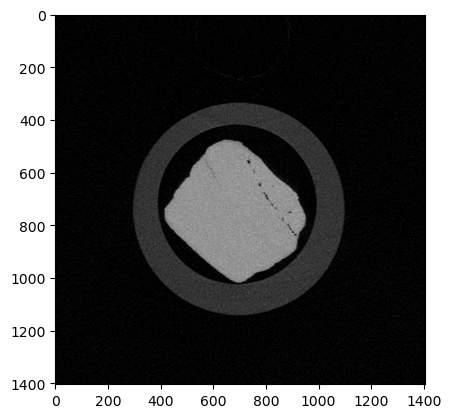

9


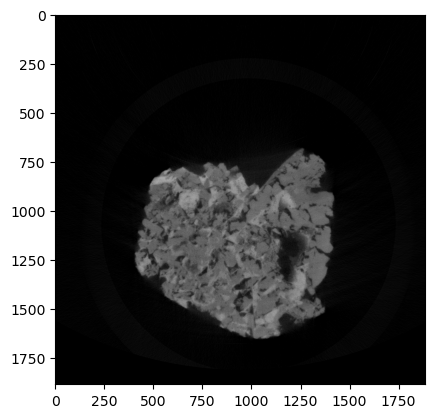

10


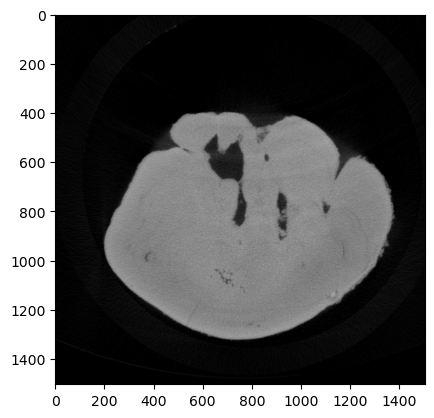

11


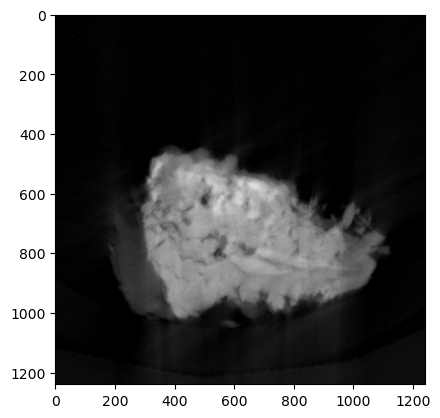

12


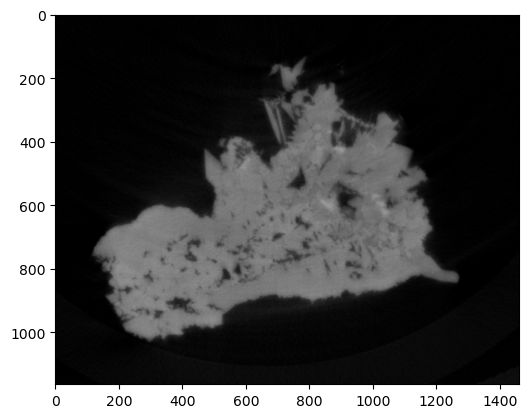

13


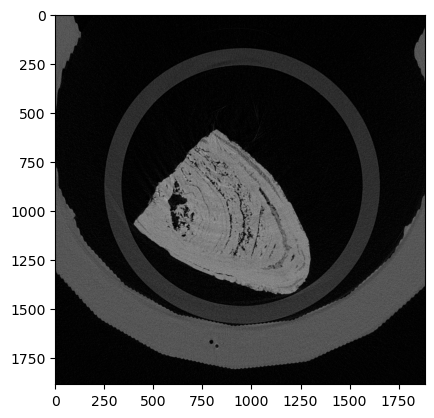

16


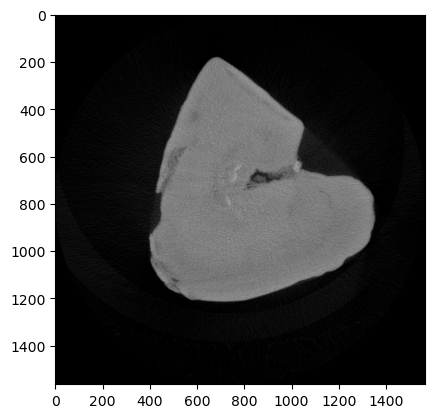

18


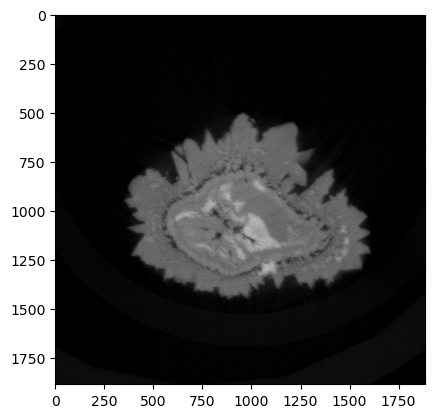

19


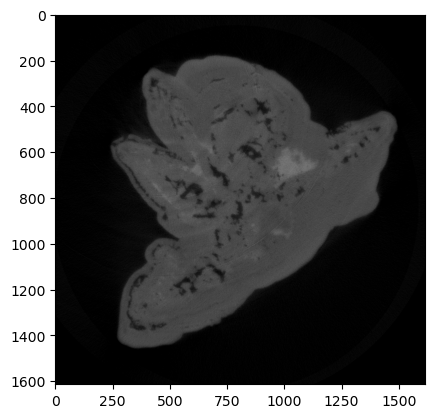

20


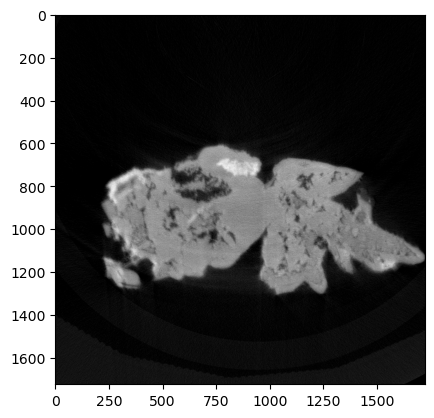

25


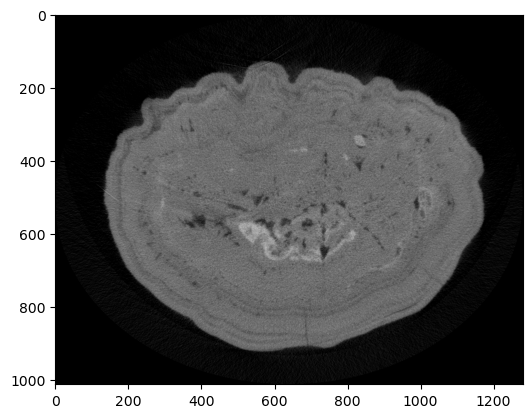

27


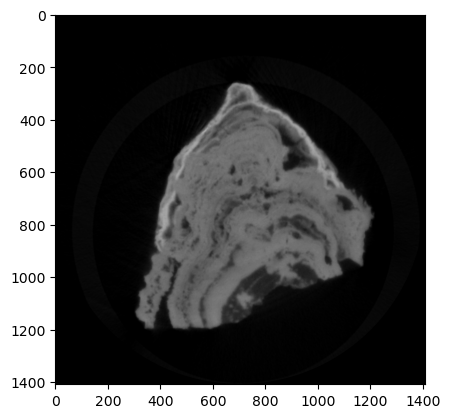

28


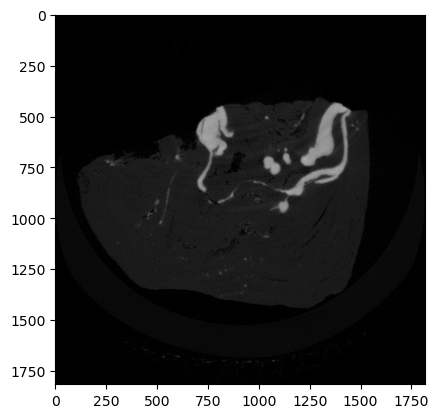

30


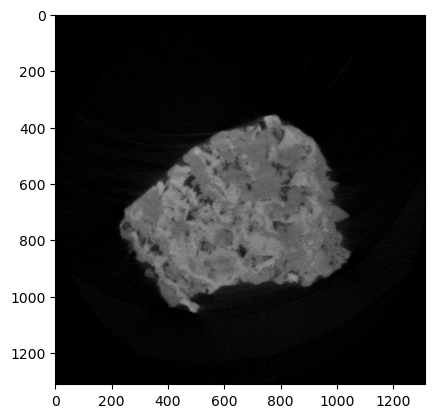

31


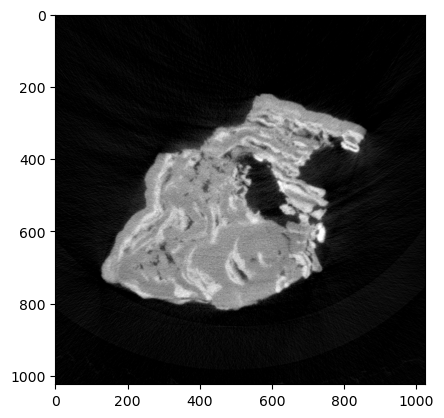

32


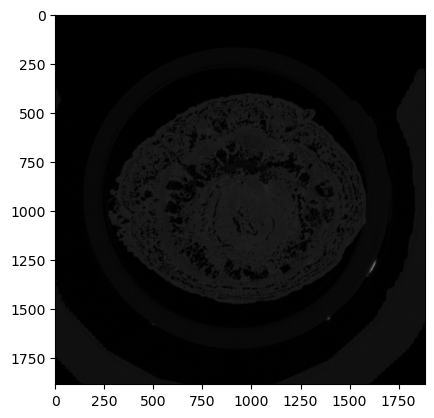

33


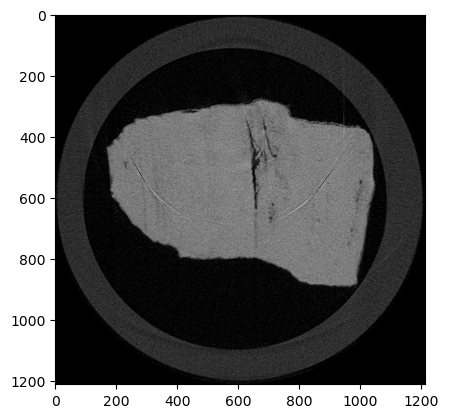

34


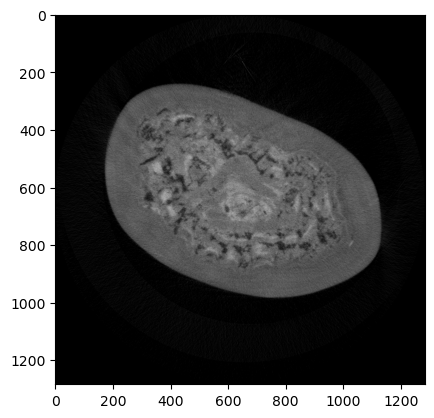

35


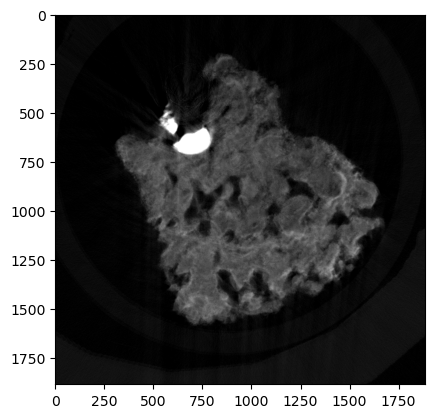

36


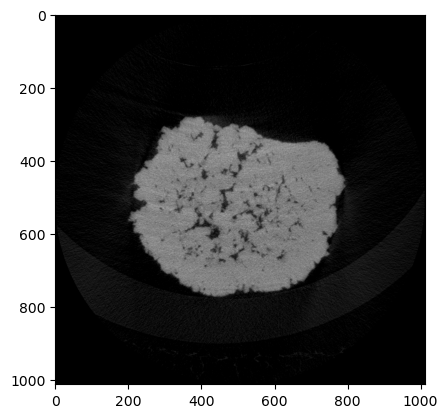

37


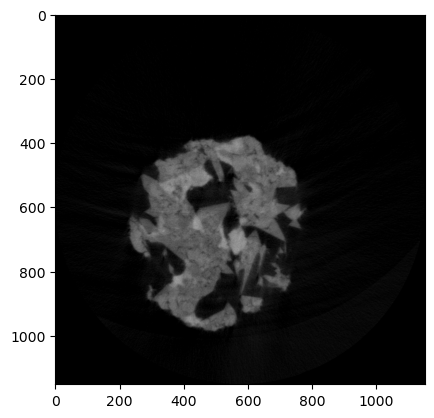

40


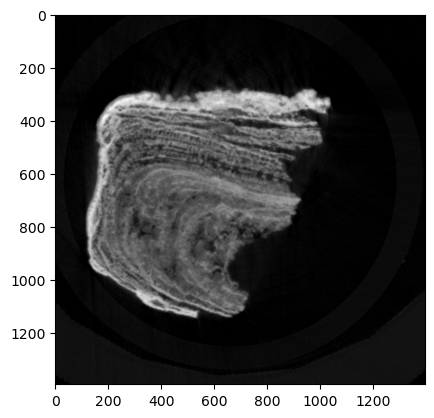

43


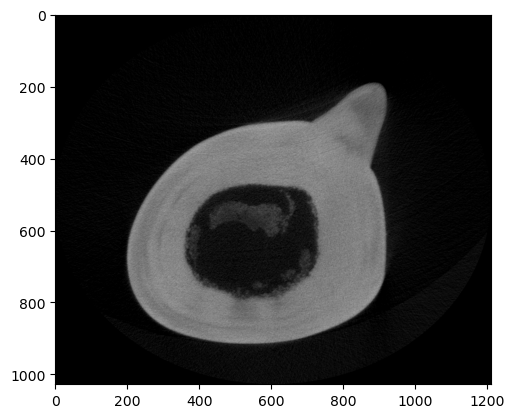

50


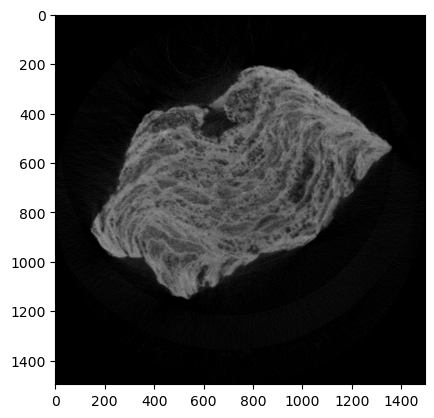

51


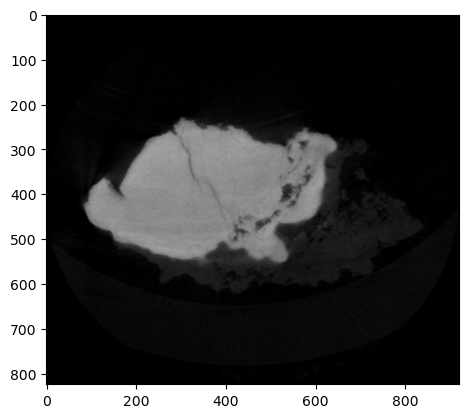

52


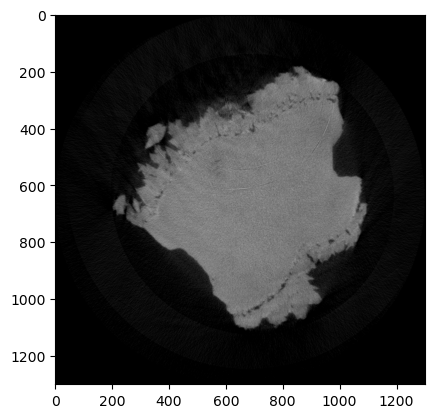

82


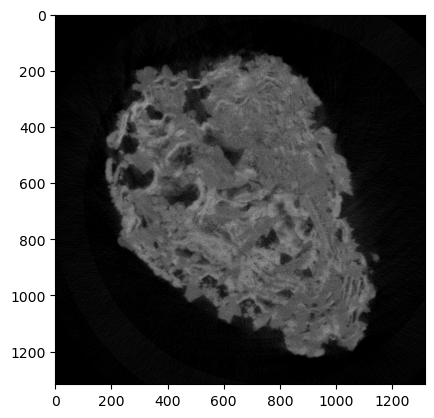

153


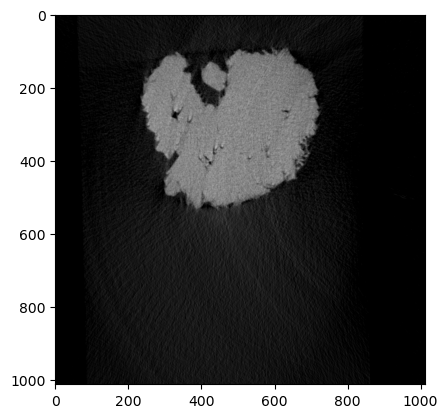

155


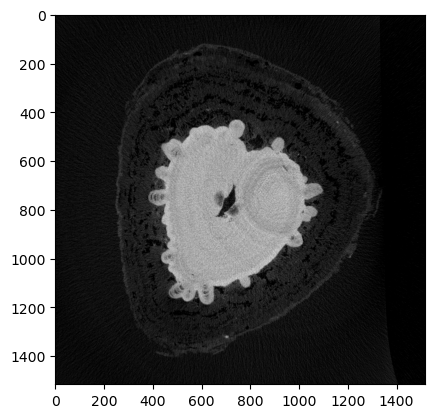

1001


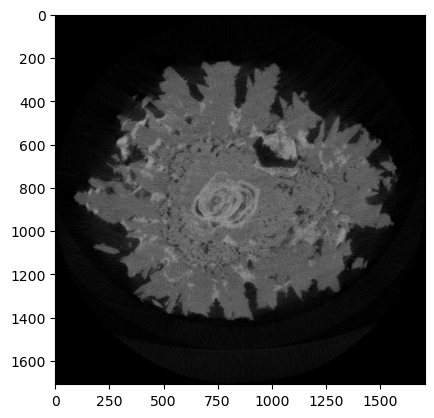

1002


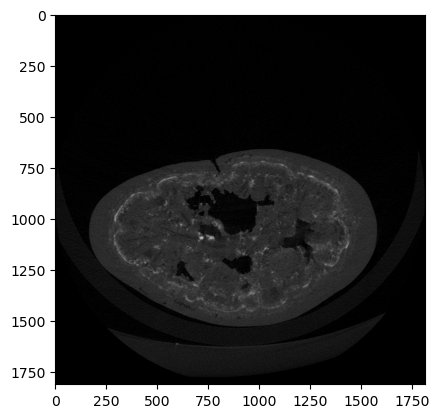

10002


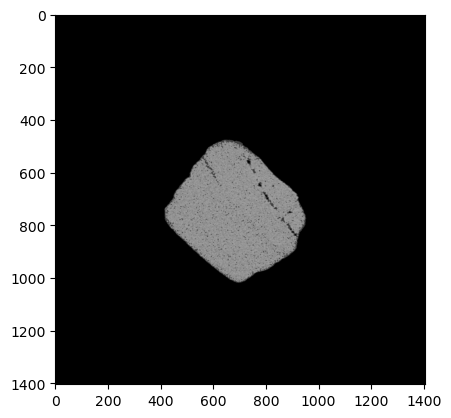

10009


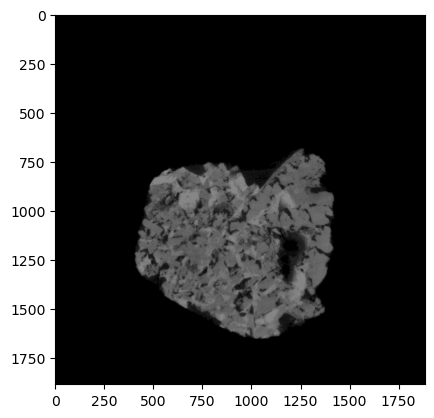

10010


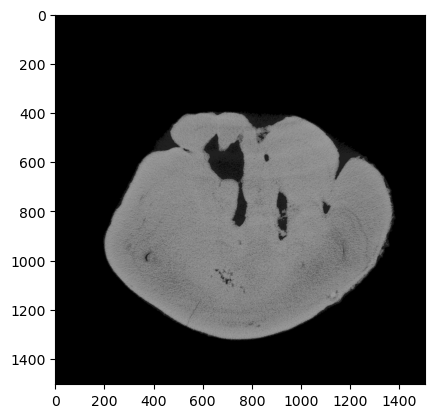

10011


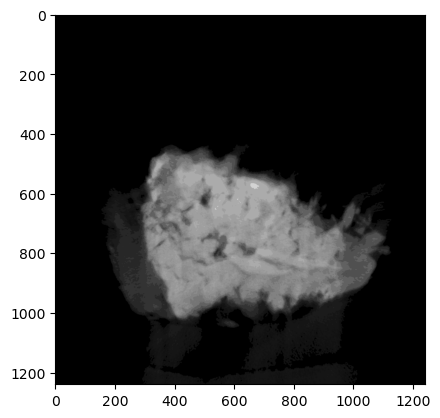

10012


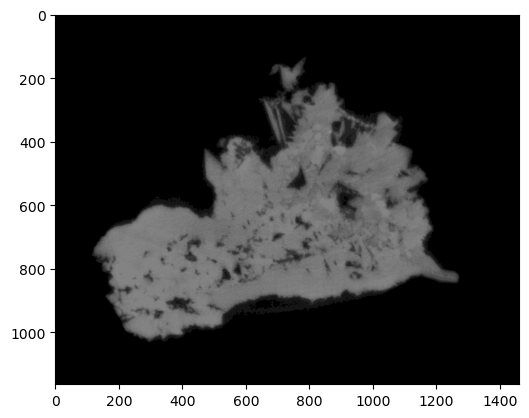

10013


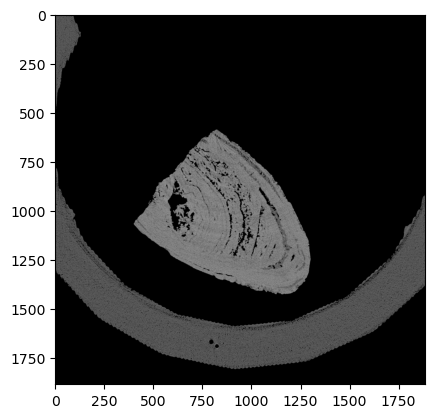

10016


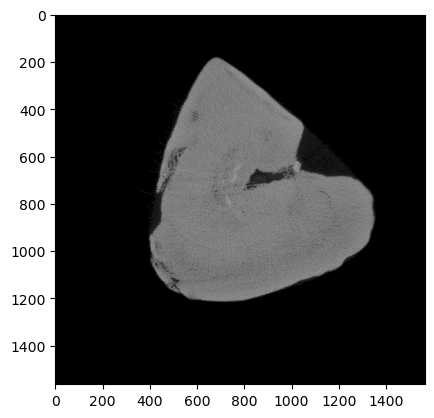

10018


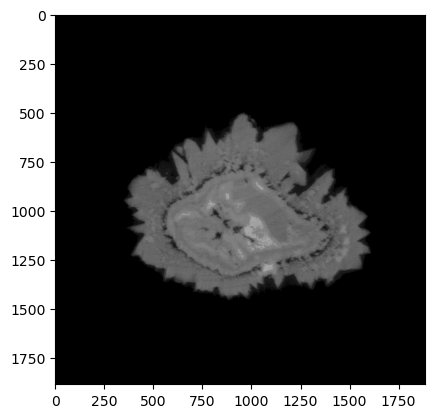

10019


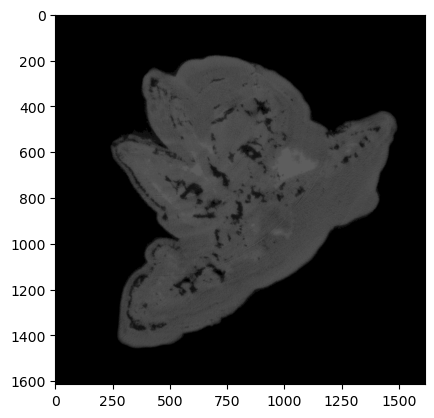

10020


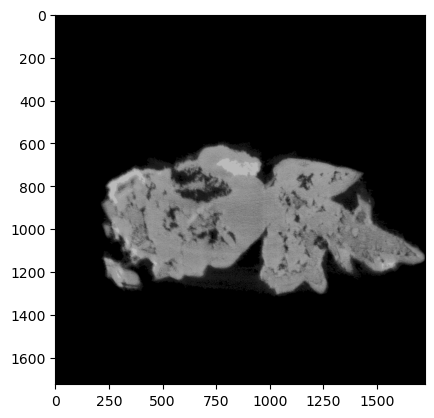

10025


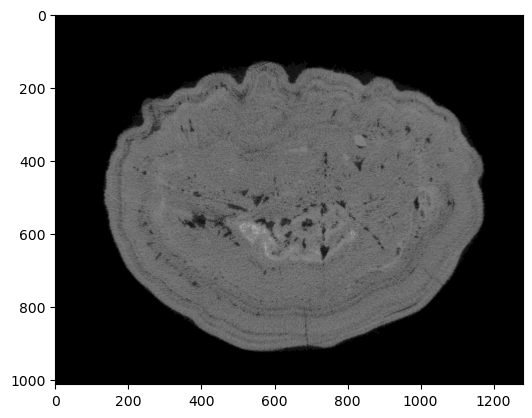

10027


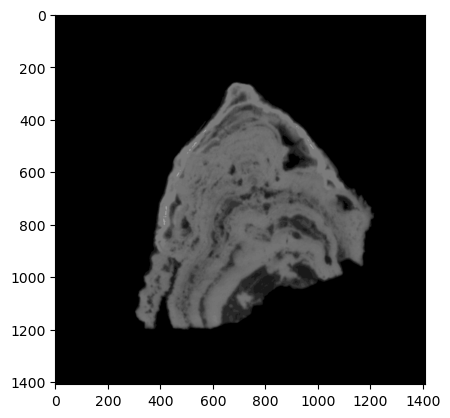

10028


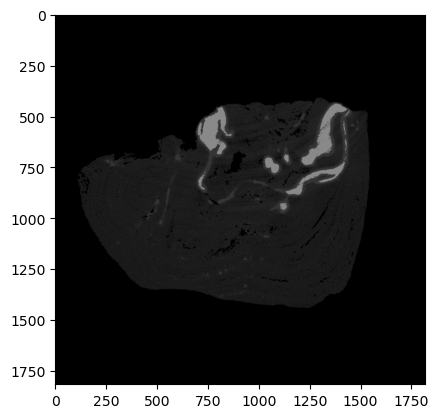

10030


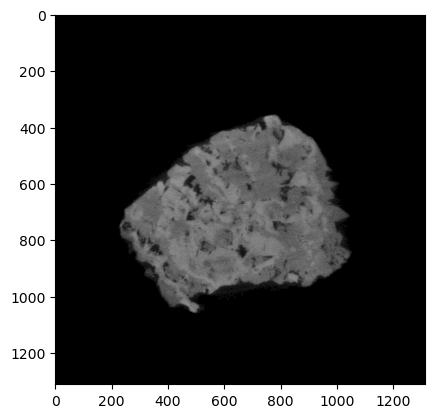

10031


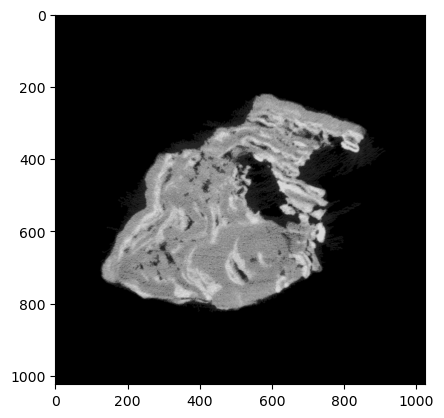

10032


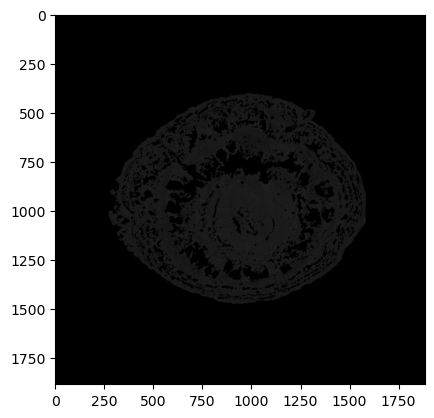

10033


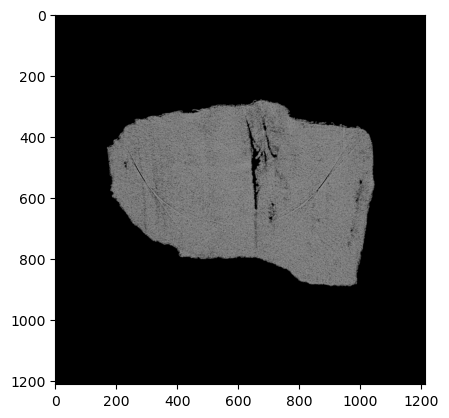

10034


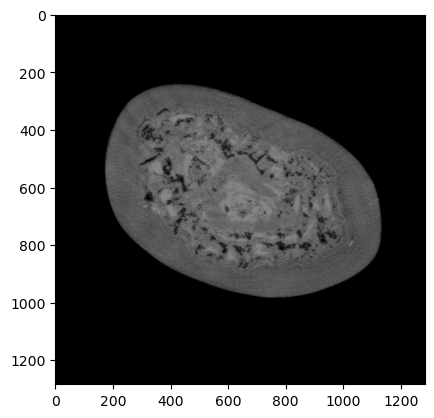

10035


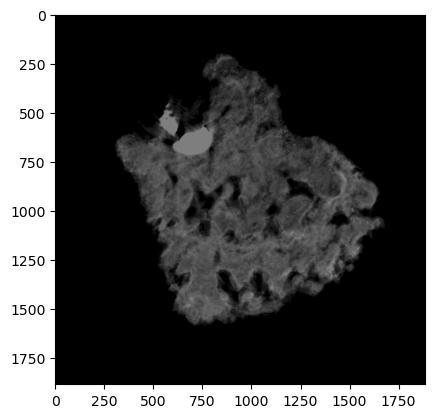

10036


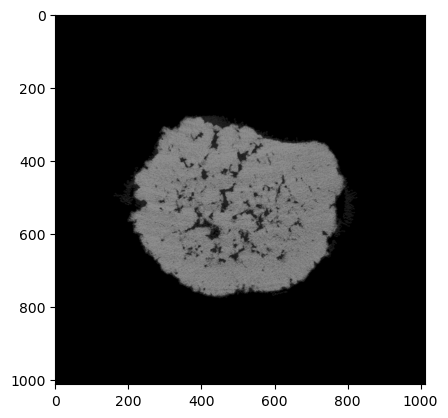

10037


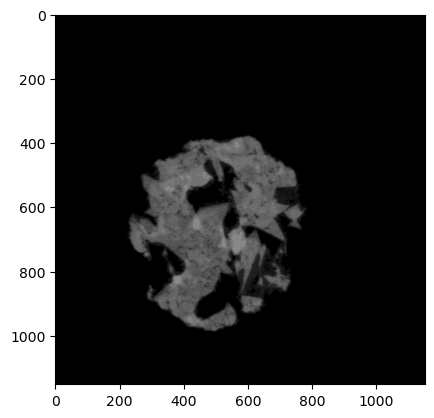

10040


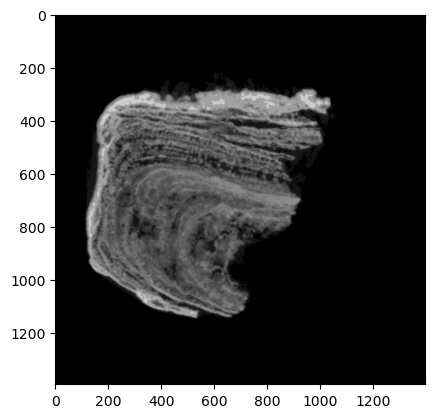

10043


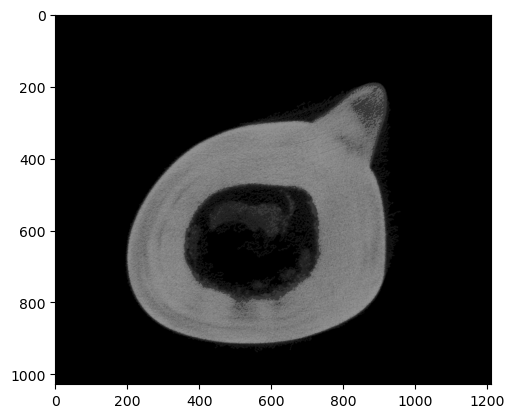

10050


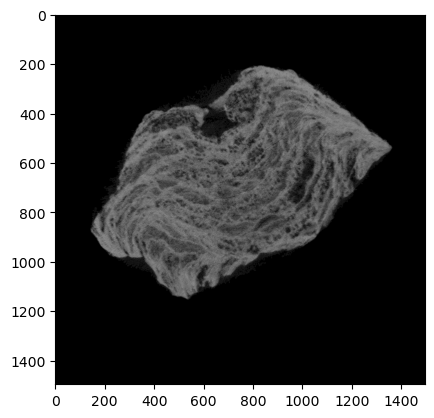

10051


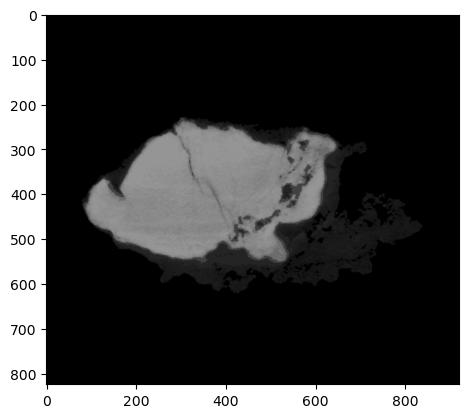

10052


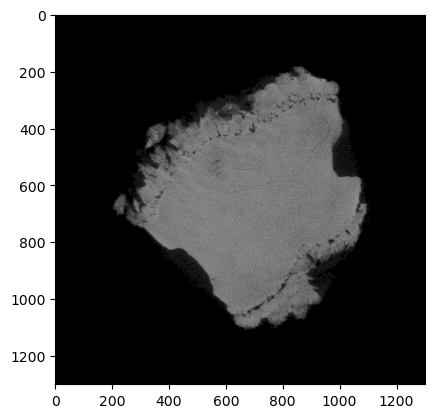

10082


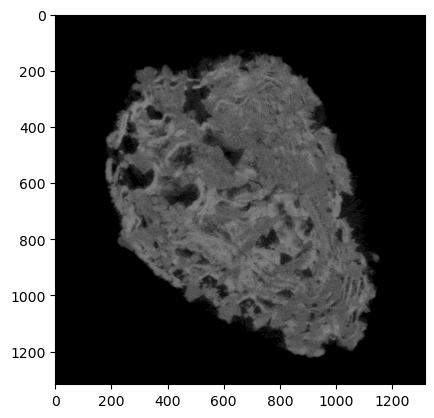

10153


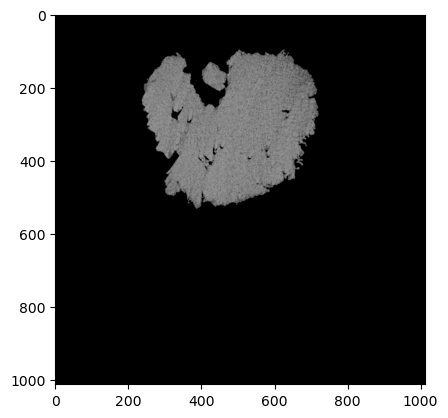

10155


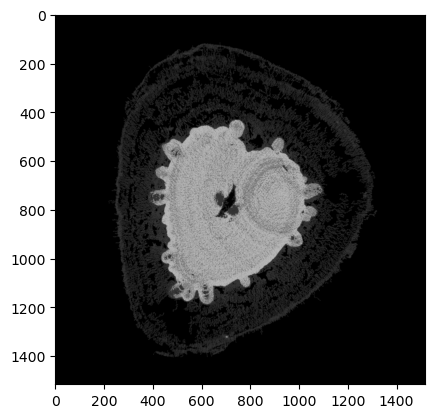

11001


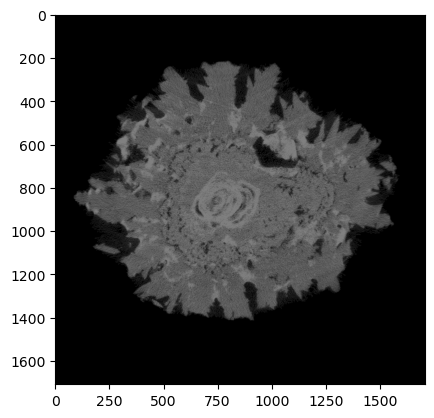

11002


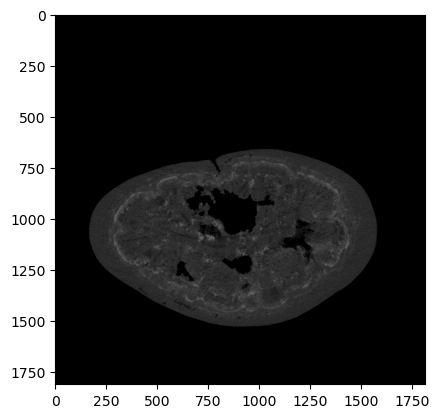

In [12]:
for i in range(len(my_Rocks)):
    calc_Ripser(my_Rocks[i])

In [ ]:
for i in range(len(my_Rocks)):
    calc_Ripser_pl(my_Rocks[i])

In [ ]:
res = Parallel(n_jobs=20)(delayed(calc_Ripser_pl)(my_Rocks[i]) for i in range(1,len(my_Rocks)))